In [170]:
from pathlib import Path
import sys
sys.path.append("..")

import numpy as np
import polars as pl
import matplotlib.pyplot as plt
import seaborn as sns

from leap.utils import IN_SCALAR_COLUMNS, IN_VECTOR_COLUMNS, OUT_SCALAR_COLUMNS, OUT_VECTOR_COLUMNS

In [175]:
dfs = []
for filename in sorted(Path("../data").glob("raw_train*.parquet"))[-2:]:
    print(filename)
    dfs.append(
        pl.read_parquet(filename)
    )
df = pl.concat(dfs)
df.head()

../data/raw_train_9802689_9902737.parquet
../data/raw_train_9902738_10002761.parquet


sample_id,state_t_0,state_t_1,state_t_2,state_t_3,state_t_4,state_t_5,state_t_6,state_t_7,state_t_8,state_t_9,state_t_10,state_t_11,state_t_12,state_t_13,state_t_14,state_t_15,state_t_16,state_t_17,state_t_18,state_t_19,state_t_20,state_t_21,state_t_22,state_t_23,state_t_24,state_t_25,state_t_26,state_t_27,state_t_28,state_t_29,state_t_30,state_t_31,state_t_32,state_t_33,state_t_34,state_t_35,…,ptend_v_31,ptend_v_32,ptend_v_33,ptend_v_34,ptend_v_35,ptend_v_36,ptend_v_37,ptend_v_38,ptend_v_39,ptend_v_40,ptend_v_41,ptend_v_42,ptend_v_43,ptend_v_44,ptend_v_45,ptend_v_46,ptend_v_47,ptend_v_48,ptend_v_49,ptend_v_50,ptend_v_51,ptend_v_52,ptend_v_53,ptend_v_54,ptend_v_55,ptend_v_56,ptend_v_57,ptend_v_58,ptend_v_59,cam_out_NETSW,cam_out_FLWDS,cam_out_PRECSC,cam_out_PRECC,cam_out_SOLS,cam_out_SOLL,cam_out_SOLSD,cam_out_SOLLD
str,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,…,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
"""train_9802689""",213.129533,230.159179,240.446757,248.889002,254.456821,249.580876,239.996574,230.973071,223.14057,219.279625,217.765597,216.351616,214.855482,213.305071,211.673142,210.329642,209.32332,209.005689,205.84391,205.751183,204.026299,204.8283,206.460112,208.857586,211.502435,214.54855,217.651684,220.908594,224.276982,227.689378,231.287474,234.943589,238.609037,242.222774,245.682765,249.039641,…,-5.0696e-7,7.9830e-8,-6.5979e-7,-7.2639e-7,-7.0396e-7,-9.9444e-8,-5.4511e-7,1.2038e-7,-7.7357e-8,-1.2048e-7,-1.6339e-7,-1.7370e-7,-3.3848e-7,-8.3355e-7,-5.3410e-7,0.000002,0.000003,0.000002,0.000006,0.000002,0.000006,-0.000025,-0.00002,-0.000012,0.000003,0.00001,0.000008,0.000008,0.000007,0.0,305.562455,0.0,3.6500e-9,0.0,0.0,0.0,0.0
"""train_9802690""",214.626094,223.884351,233.507616,255.02663,260.547429,256.489366,243.360965,232.58887,224.052828,219.069629,216.214017,214.101354,212.225896,210.589764,209.268578,208.260039,207.683645,207.402772,205.041717,205.696326,204.07862,204.750483,206.254972,208.695061,211.496755,214.871018,218.892267,223.033273,226.885533,230.694955,234.407265,238.07935,241.643545,245.02581,248.26158,251.341504,…,-1.9359e-8,1.2922e-8,-2.6076e-9,-5.8494e-8,3.7061e-8,2.4683e-8,-4.3433e-8,-3.3977e-8,-2.7784e-8,-1.5013e-7,-5.1880e-8,-1.2169e-7,-0.000001,-6.2870e-7,-1.2549e-8,-2.0267e-7,2.2499e-7,4.5399e-8,-9.3609e-7,-0.000001,-0.000002,-0.000003,-0.000003,-2.1376e-7,0.000004,0.000007,0.000004,-0.000005,0.000004,8.9311,357.017739,7.0272e-10,1.3434e-7,3.3450e-33,9.2931e-38,6.073081,3.480244
"""train_9802691""",219.686283,234.792759,248.380446,260.660366,262.106741,254.076875,239.839413,228.801631,220.431804,215.097054,212.204851,210.512143,209.455747,208.796013,208.467414,208.422489,208.753876,209.251974,207.35477,207.192489,205.32603,205.58873,206.515557,208.244101,210.276995,212.671656,215.299989,218.144365,220.950224,223.782296,226.739097,229.737369,232.837799,235.796052,238.705951,241.551909,…,4.2432e-7,1.0299e-7,-5.1860e-7,0.000002,-0.000002,-3.0729e-7,-1.6001e-7,-3.2089e-7,-4.3216e-7,-3.0066e-7,8.8412e-8,-7.1423e-7,-0.000002,-0.000002,-0.000001,-0.000003,-2.3475e-8,0.000006,0.000003,-0.000008,-0.000013,-0.000023,-0.000025,-0.000011,0.000014,0.000022,0.000017,0.000014,0.000017,0.0,311.781366,1.7460e-8,3.0897e-8,0.0,0.0,0.0,0.0
"""train_9802692""",216.869006,242.774643,253.684221,257.336606,256.457563,247.511092,236.214077,227.700368,220.644395,217.337559,216.238513,215.342366,214.447962,213.465225,212.305998,211.21239,210.22238,210.225927,206.623637,206.294603,204.214532,204.720992,205.749594,207.834129,209.927728,212.90103,215.81865,219.240518,222.69696,226.168866,229.88685,233.606569,237.36484,241.073554,244.645148,248.124699,…,-0.000003,-0.000004,-0.000003,-2.1175e-7,-0.000005,-0.000004,0.000004,0.000002,0.000002,-3.7469e-7,-0.000001,-0.000001,-0.00001,-0.000004,0.000001,-0.000013,-0.000011,0.

In [176]:
df.shape

(200073, 925)

In [177]:
raw_df = pl.read_csv("../data/train.csv", n_rows=1000000)

0.0 1400.5780986591612


array([[<Axes: title={'center': 'pbuf_SOLIN'}>]], dtype=object)

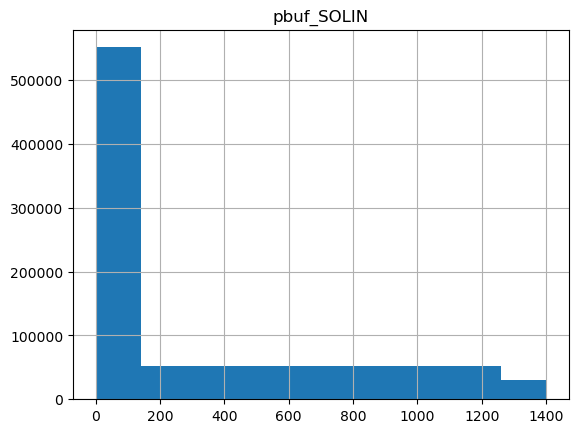

In [178]:
i = 0
col = f"pbuf_SOLIN"
print(raw_df[col].min(), raw_df[col].max())
raw_df.select(pl.col(col)).to_pandas().hist()

In [179]:
1 / raw_df.filter(pl.col(f"state_q0002_{i}") > 1e-7)[f"state_q0002_{i}"].mean()

TypeError: unsupported operand type(s) for /: 'int' and 'NoneType'

In [ ]:
import numpy as np
raw_df.select(1 - pl.lit(np.e).pow(-134085.19786395598*pl.col(f"state_q0002_{i}"))).to_pandas().hist()

In [ ]:
i = 30
raw_df.select(
    pl.col(f"state_t_{i}") - 273.14,
    pl.col(f"state_q0002_{i}"),
    pl.col(f"state_q0003_{i}"),
    pl.col(f"ptend_q0002_{i}"),
    pl.col(f"ptend_q0003_{i}"),
    (pl.col(f"ptend_q0002_{i}") + pl.col(f"ptend_q0003_{i}")).alias("sum"),
)

In [180]:
def plot_correlation(df, in_cols, out_cols):
    plt.figure(figsize=(10,10))
    corrs = []
    for in_col in in_cols:
        corr_inner = []
        for out_col in out_cols:
            corr_inner.append(df[[in_col, out_col]].corr()[0, 1])
        corrs.append(corr_inner)
    sns.heatmap(corrs, xticklabels=out_cols, yticklabels=in_cols, vmin=-1, vmax=1)
    plt.show()

## scalar

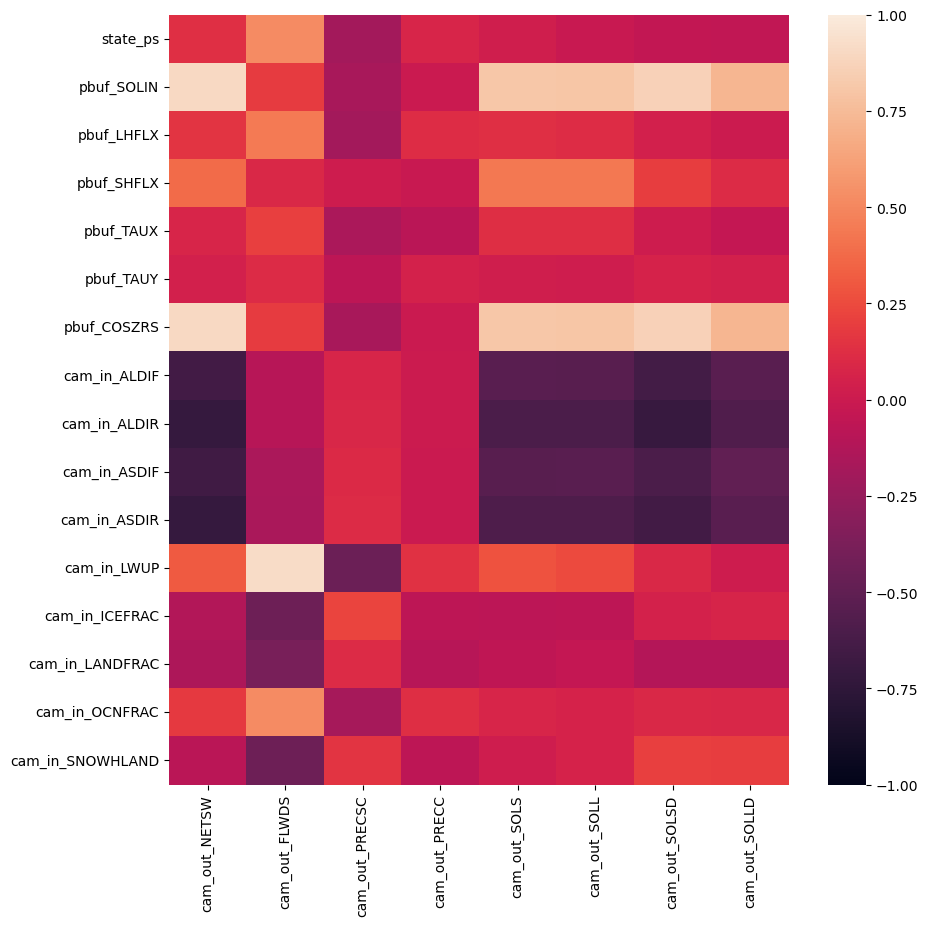

In [181]:
plot_correlation(df, IN_SCALAR_COLUMNS, OUT_SCALAR_COLUMNS)

## ptend_t

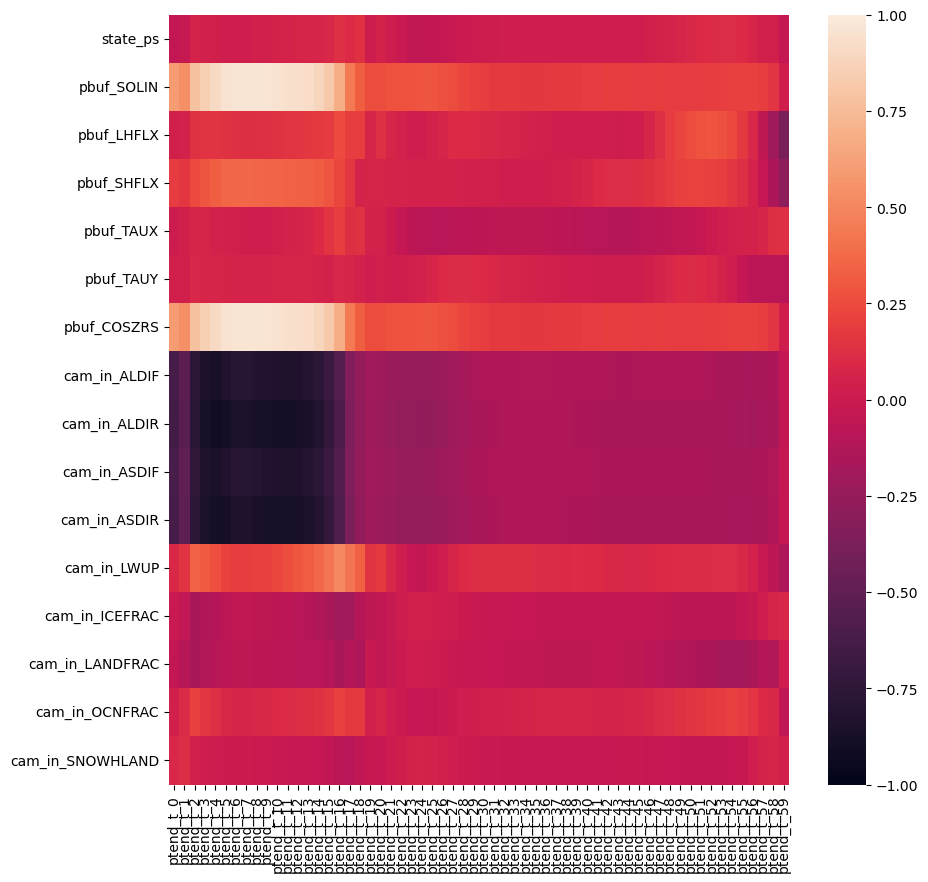

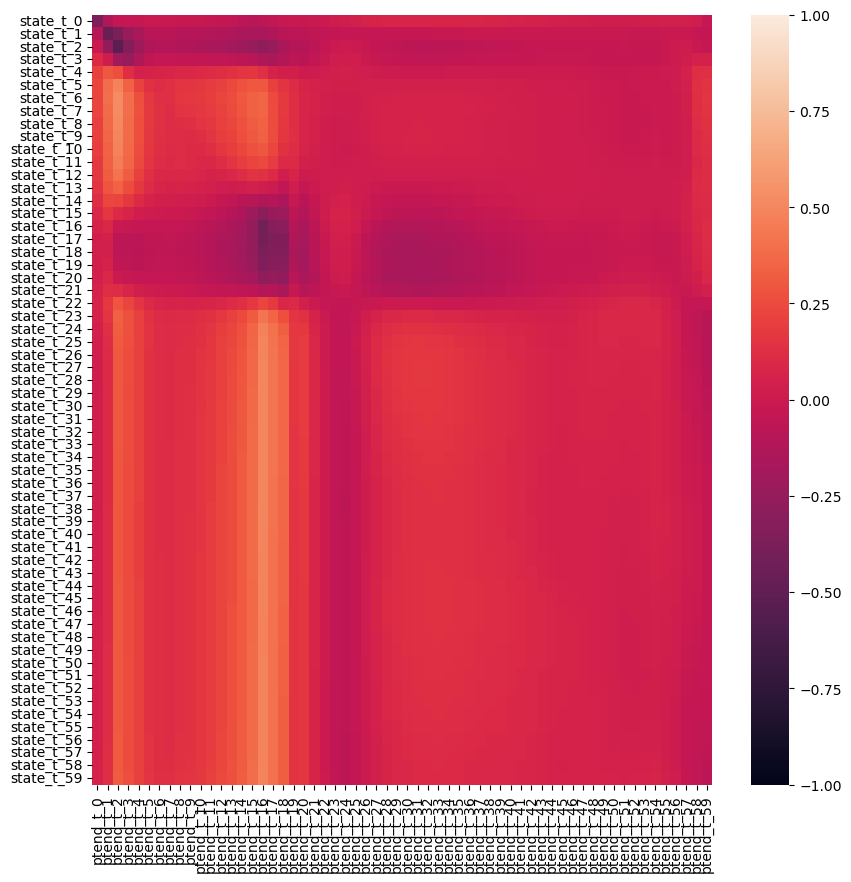

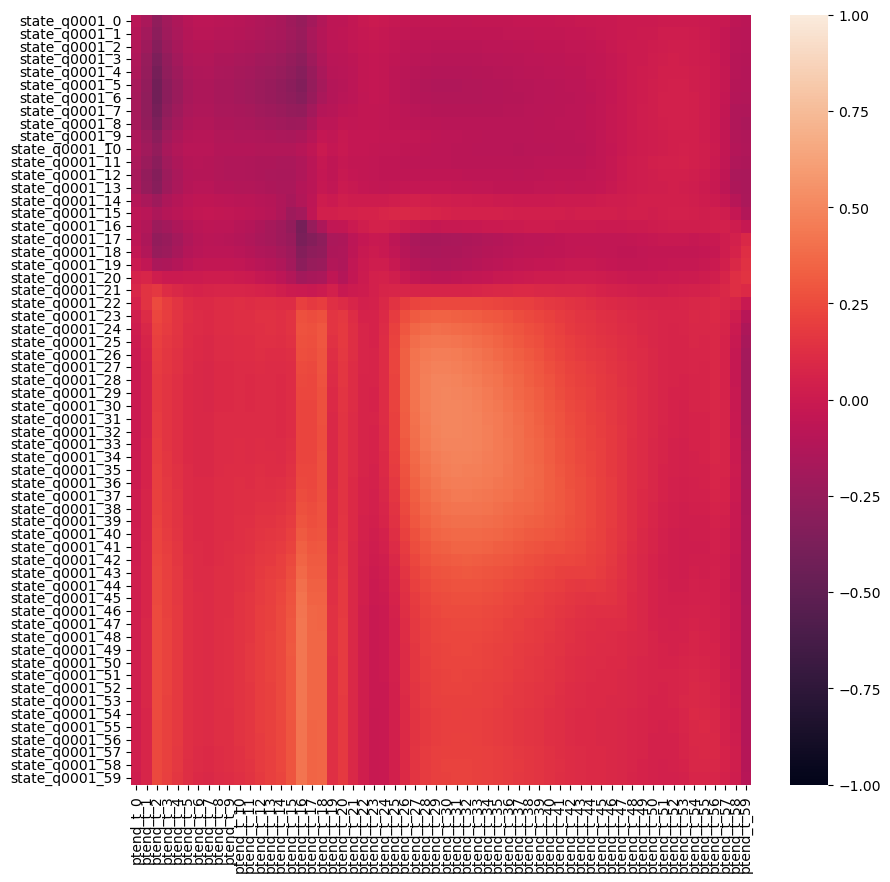

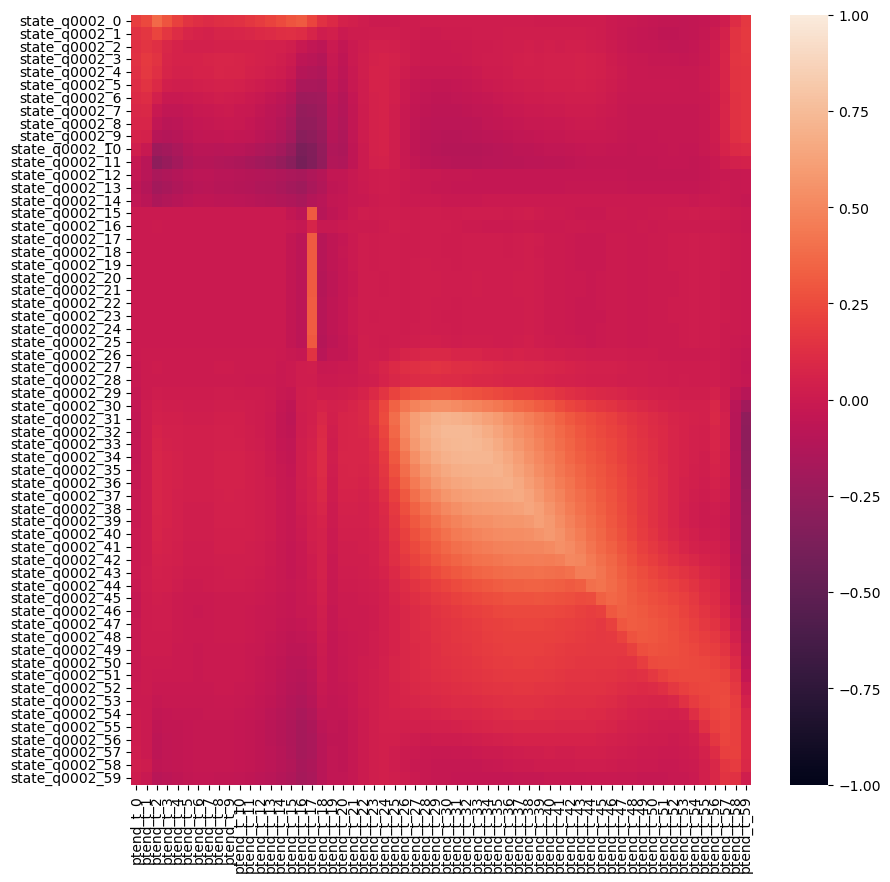

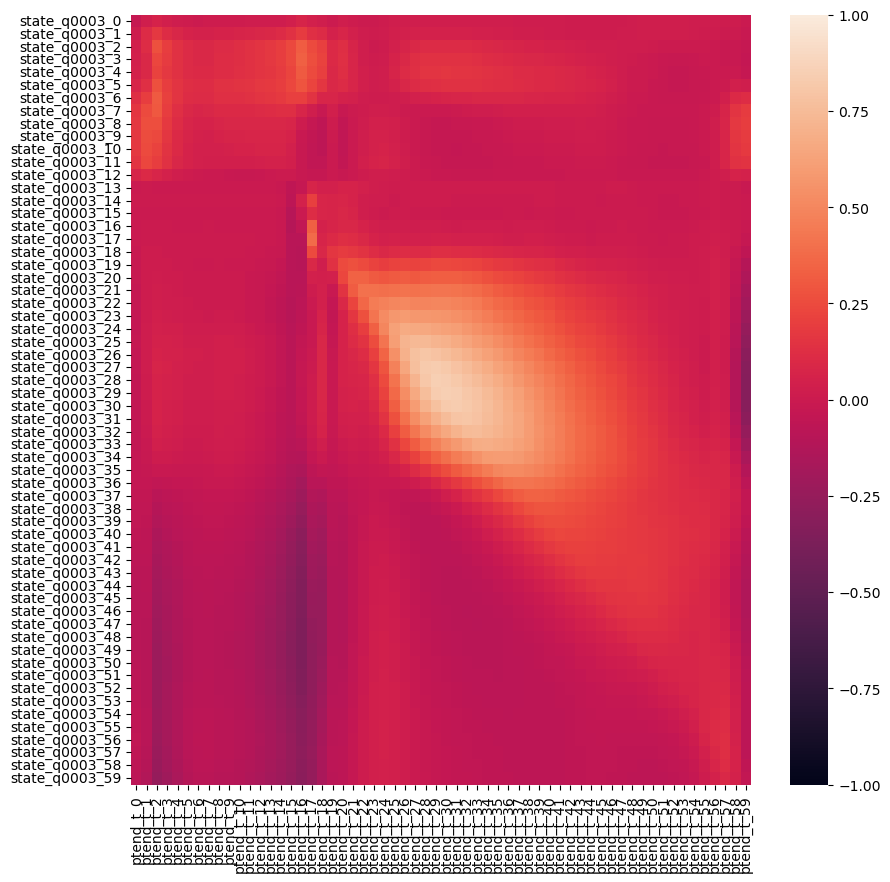

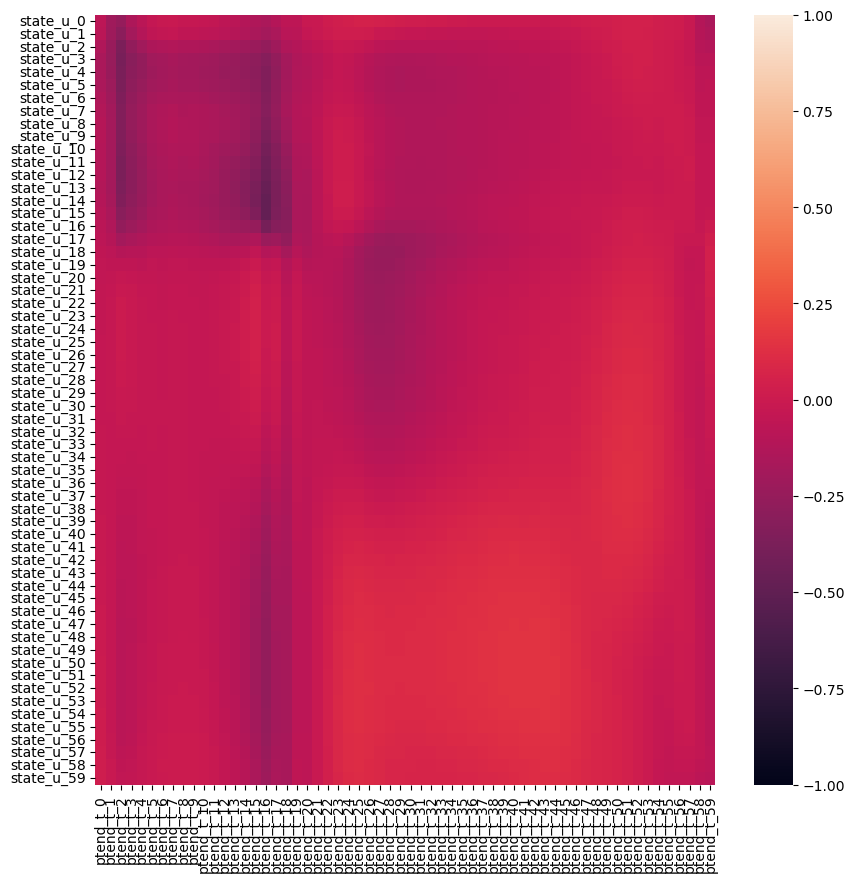

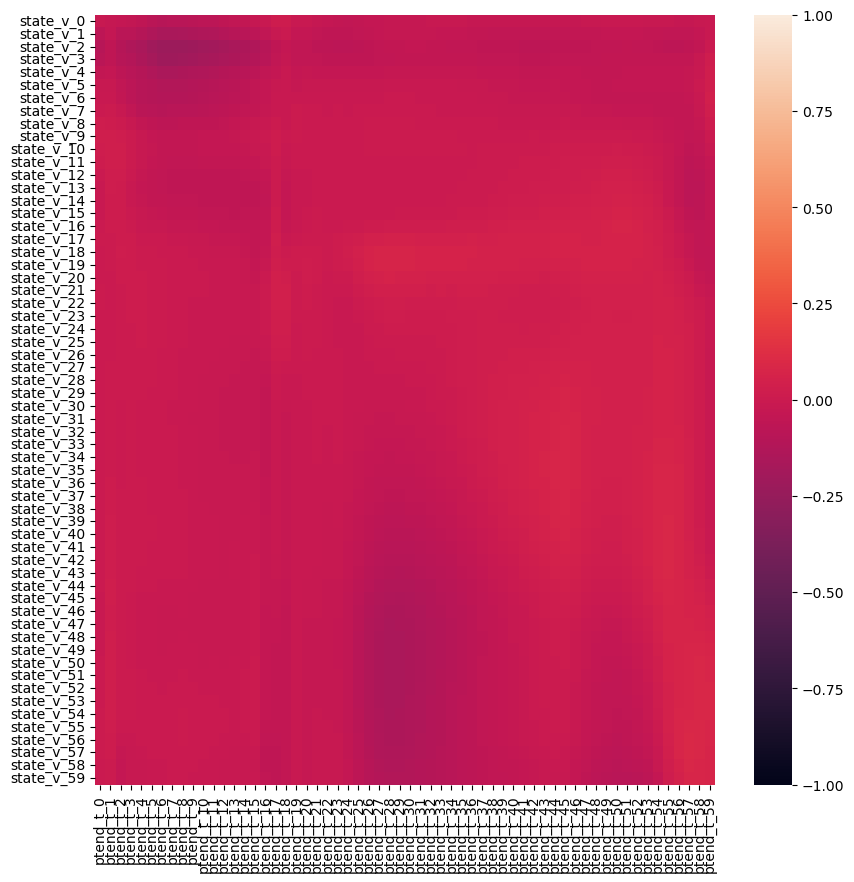

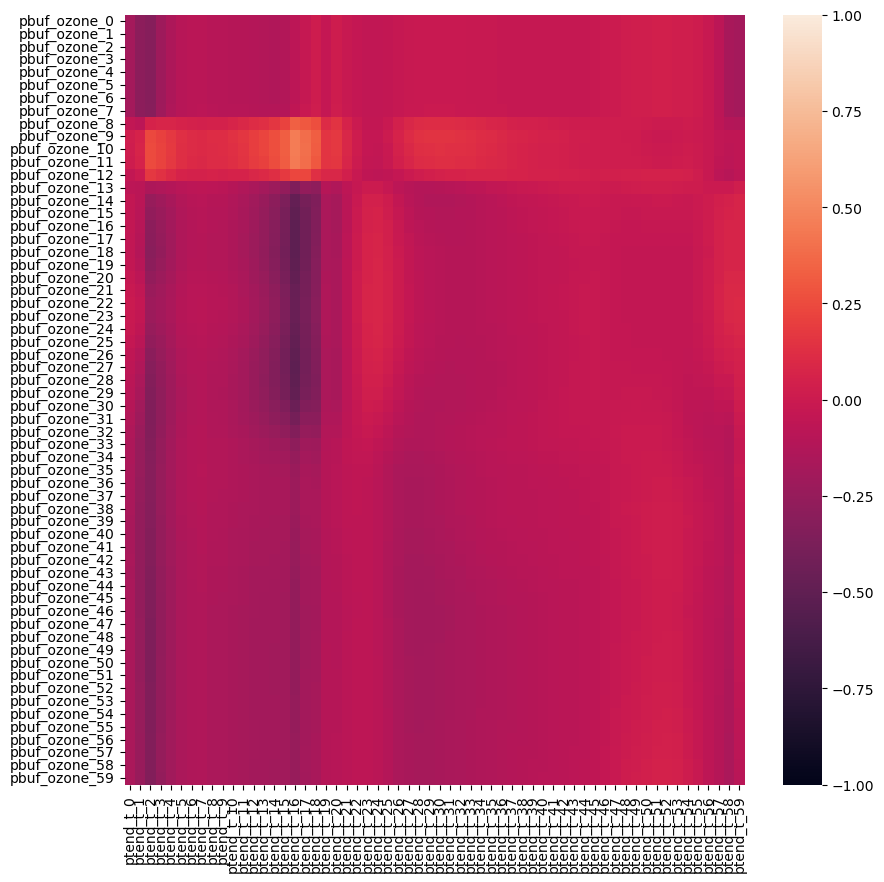

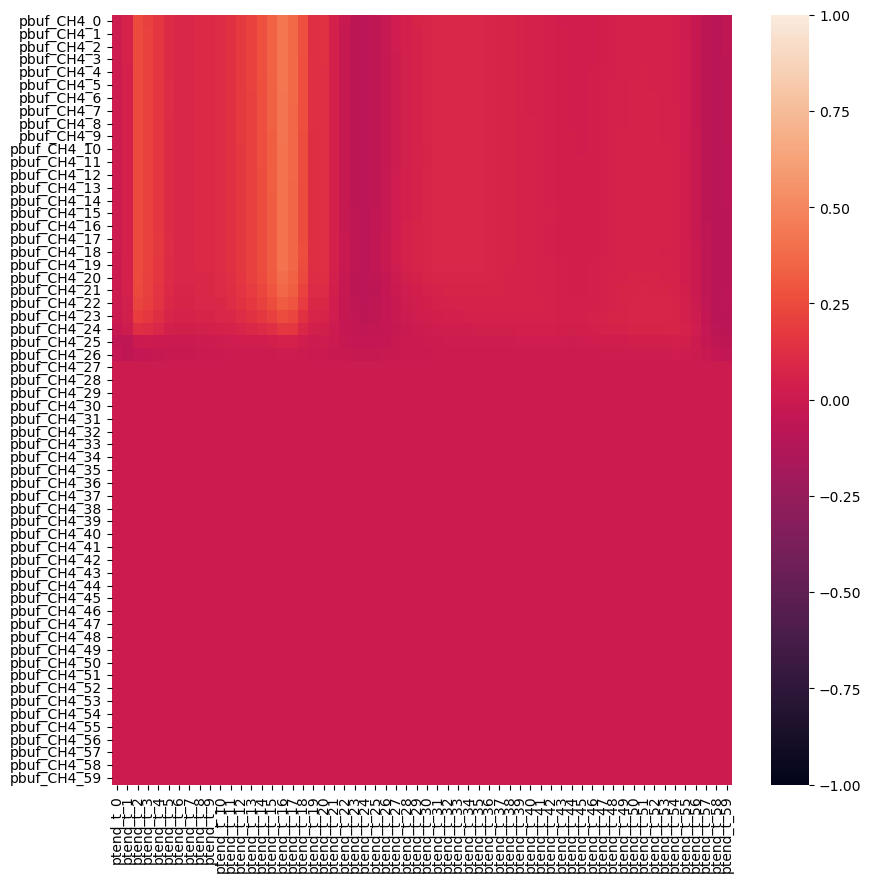

/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


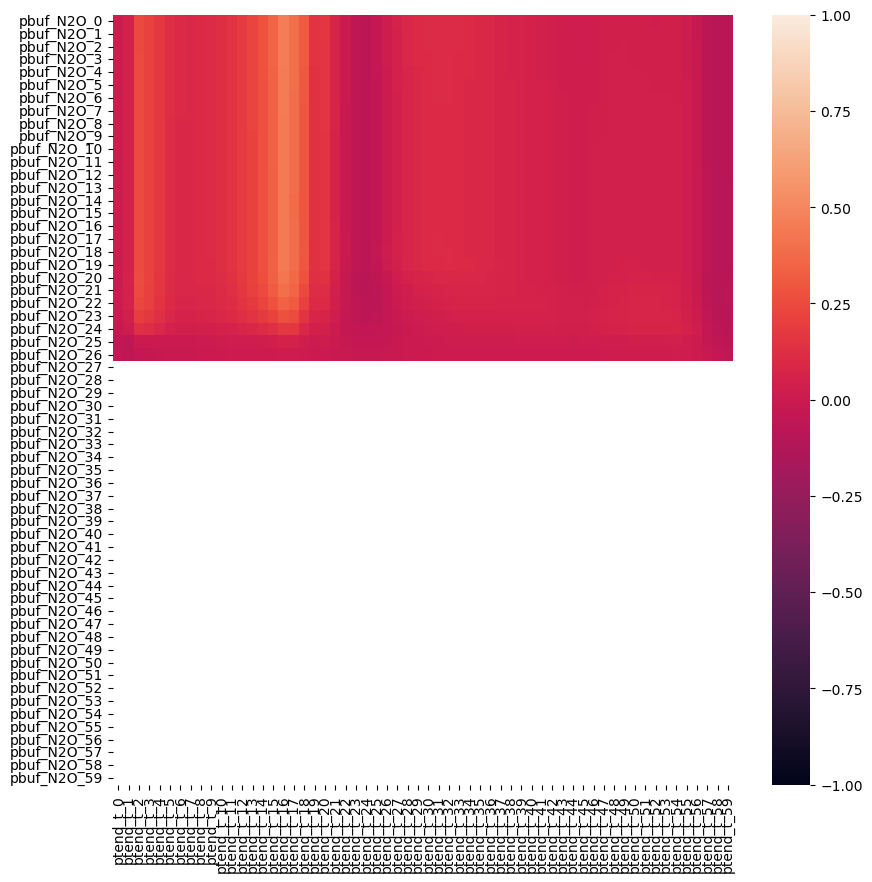

In [6]:
col = "ptend_t"
out_cols = [f"{col}_{i}" for i in range(60)]
in_cols = IN_SCALAR_COLUMNS
plot_correlation(df, in_cols, out_cols)
for col in IN_VECTOR_COLUMNS:
    in_cols = [f"{col}_{i}" for i in range(60)]
    plot_correlation(df, in_cols, out_cols)

## q0001

/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


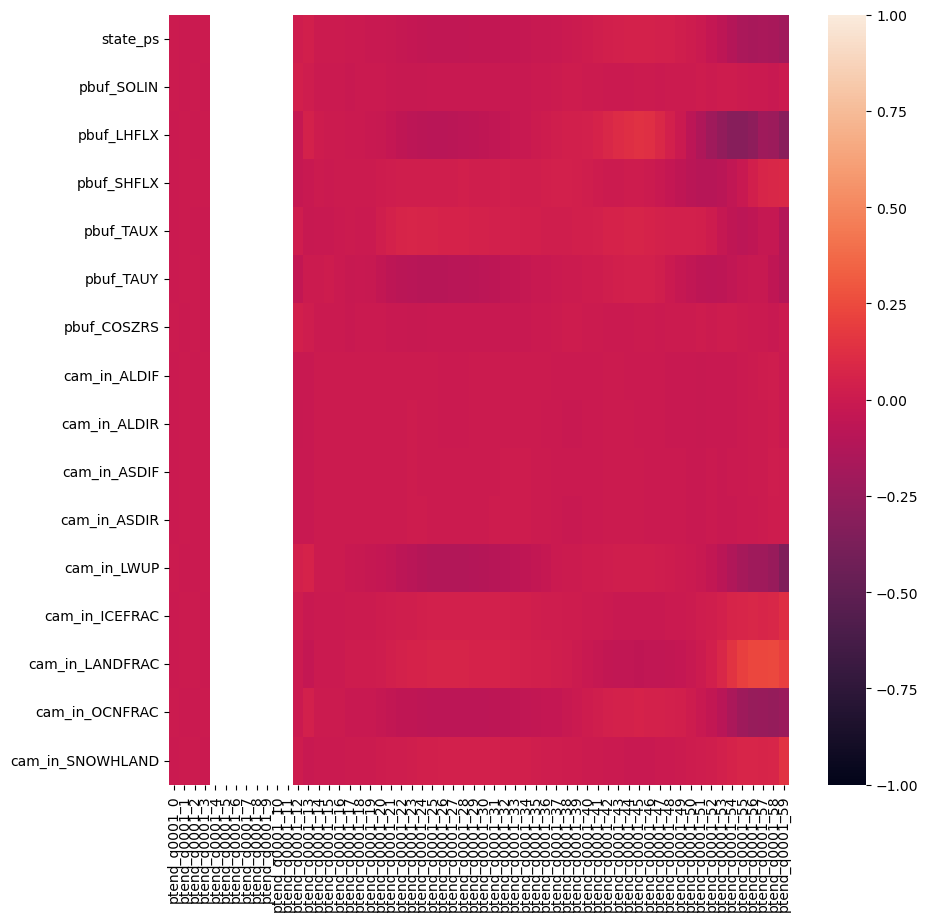

/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


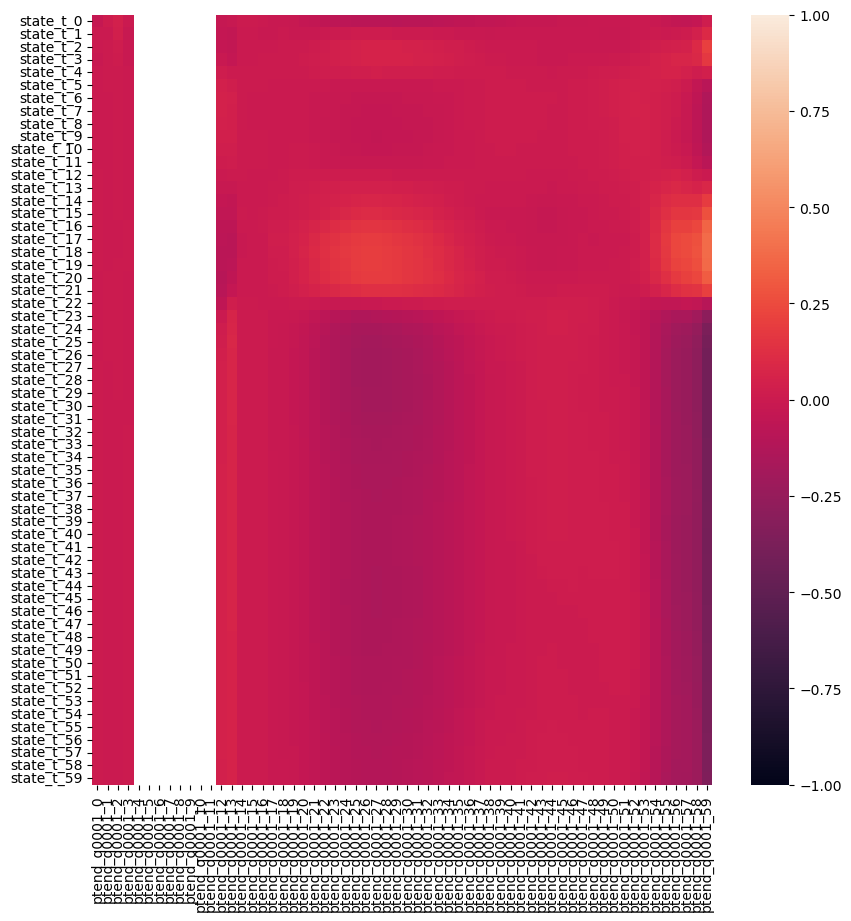

/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


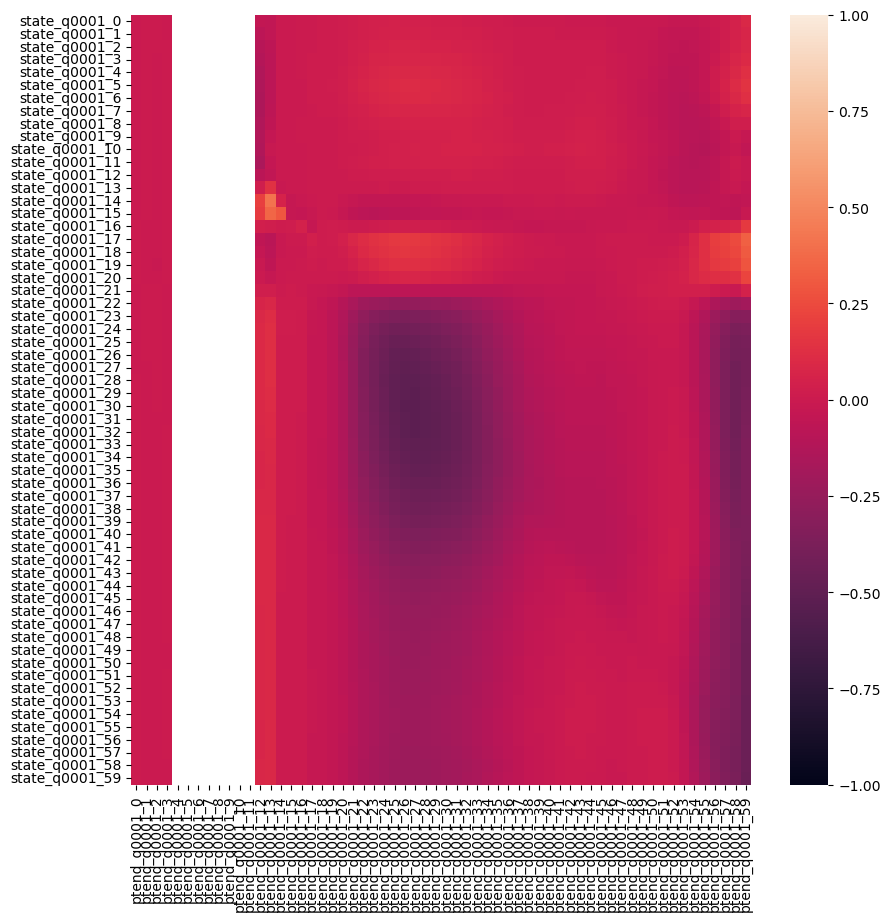

/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


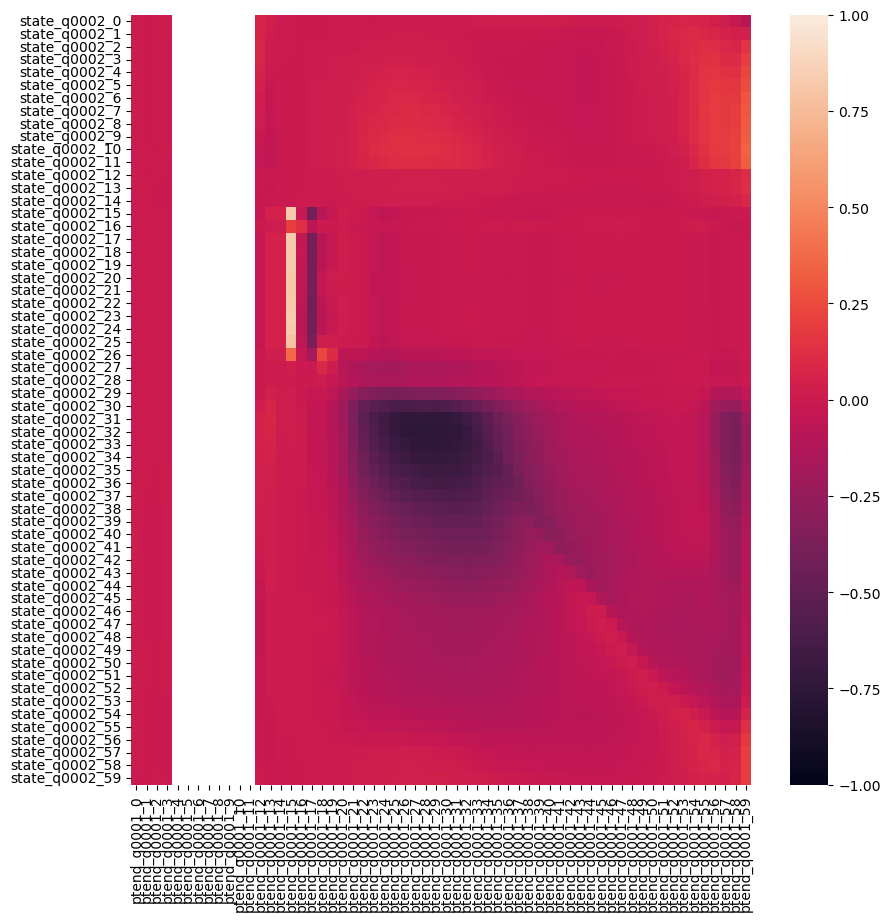

/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


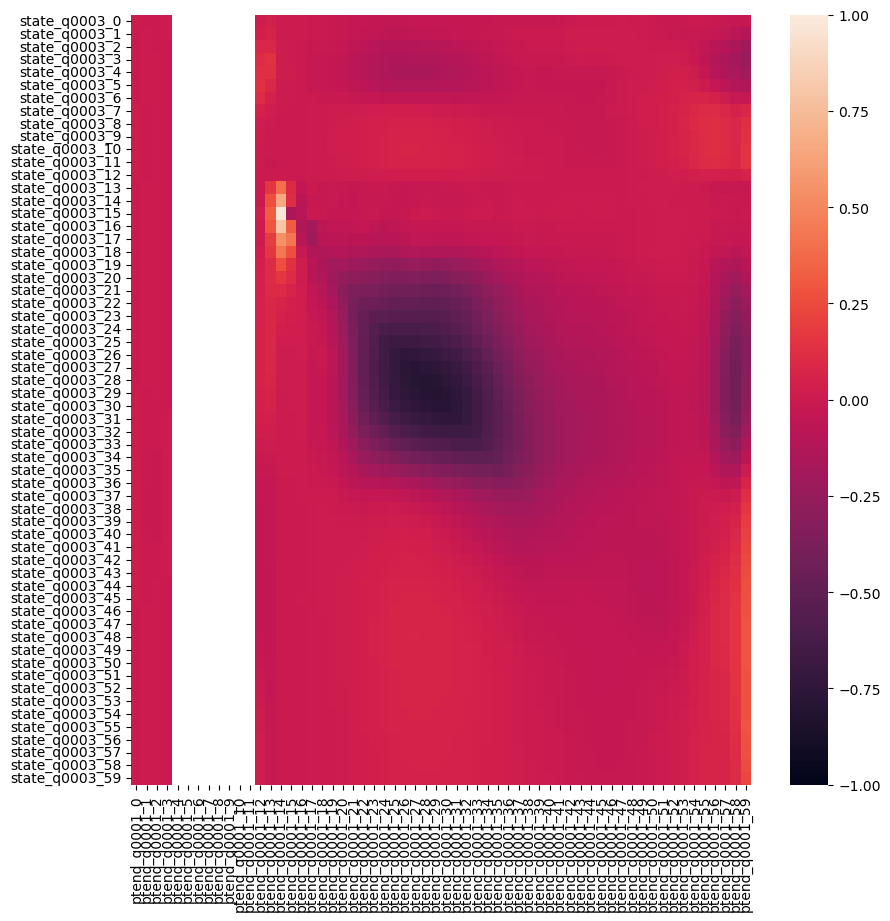

/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


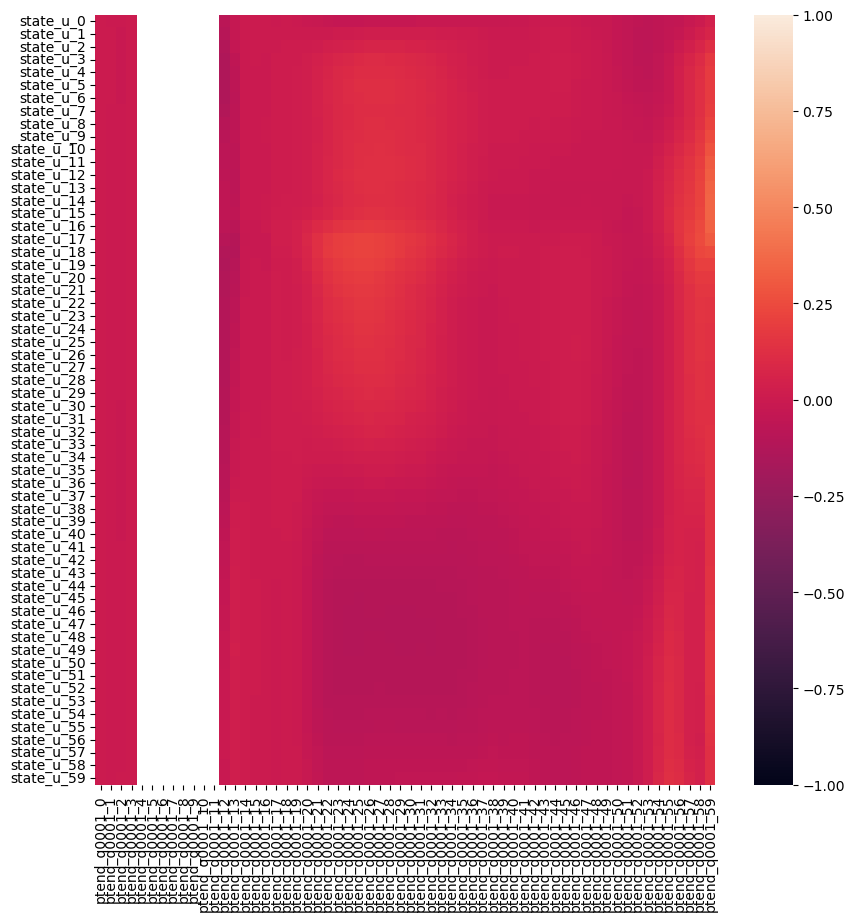

/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


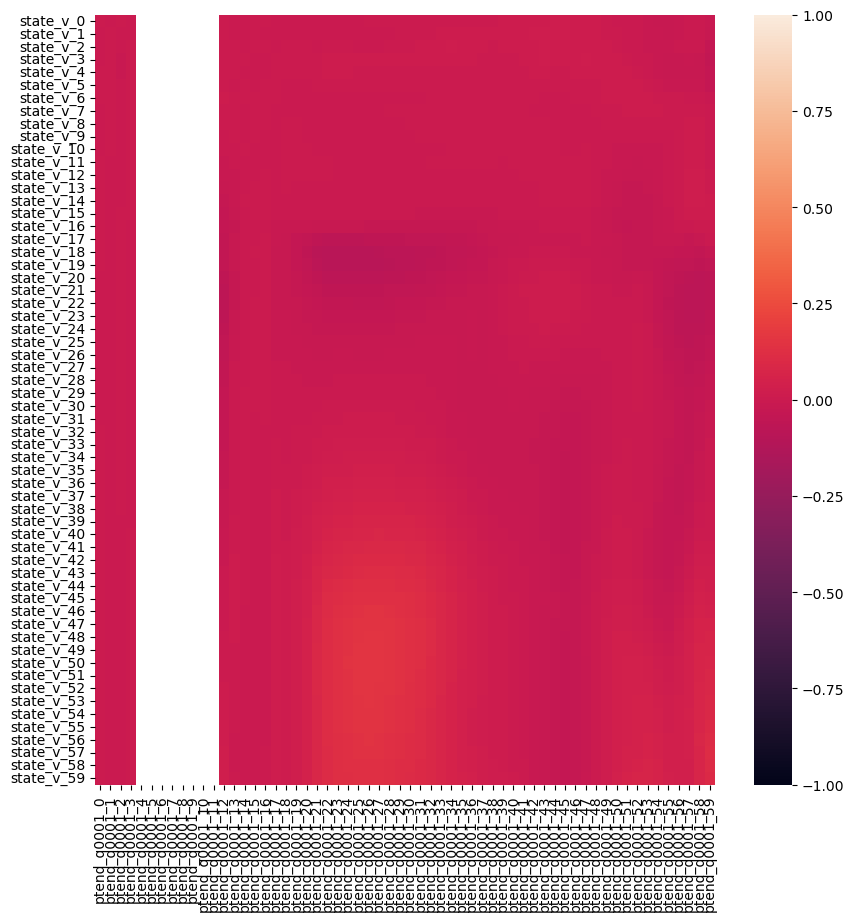

/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


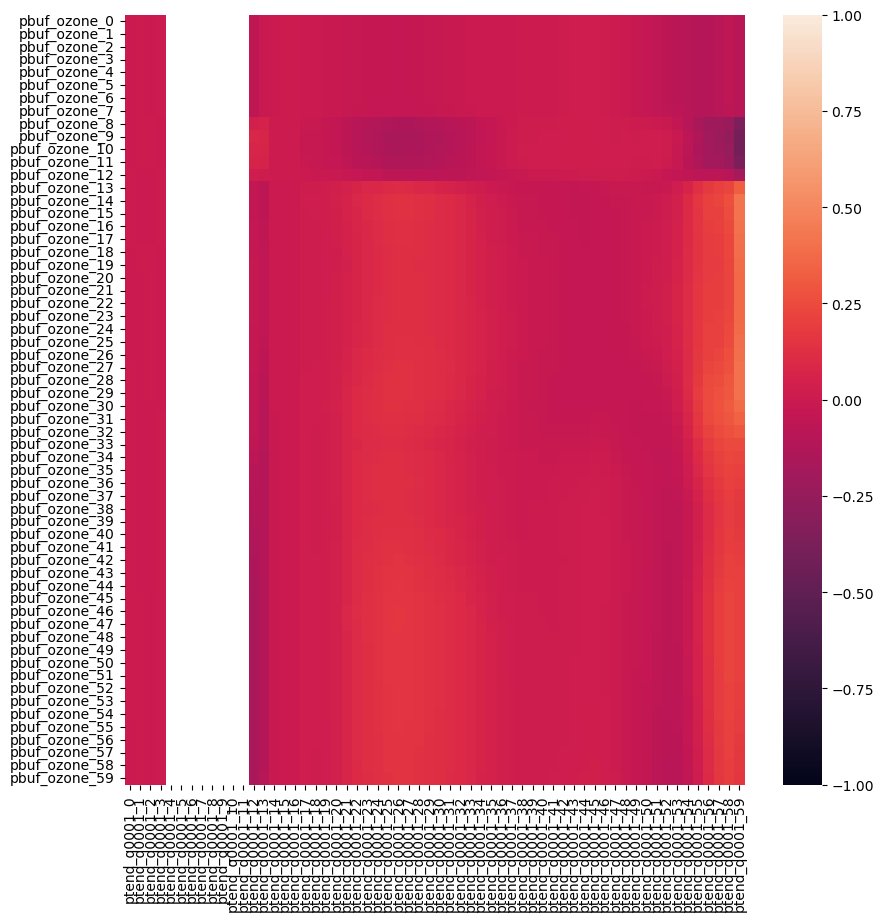

/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


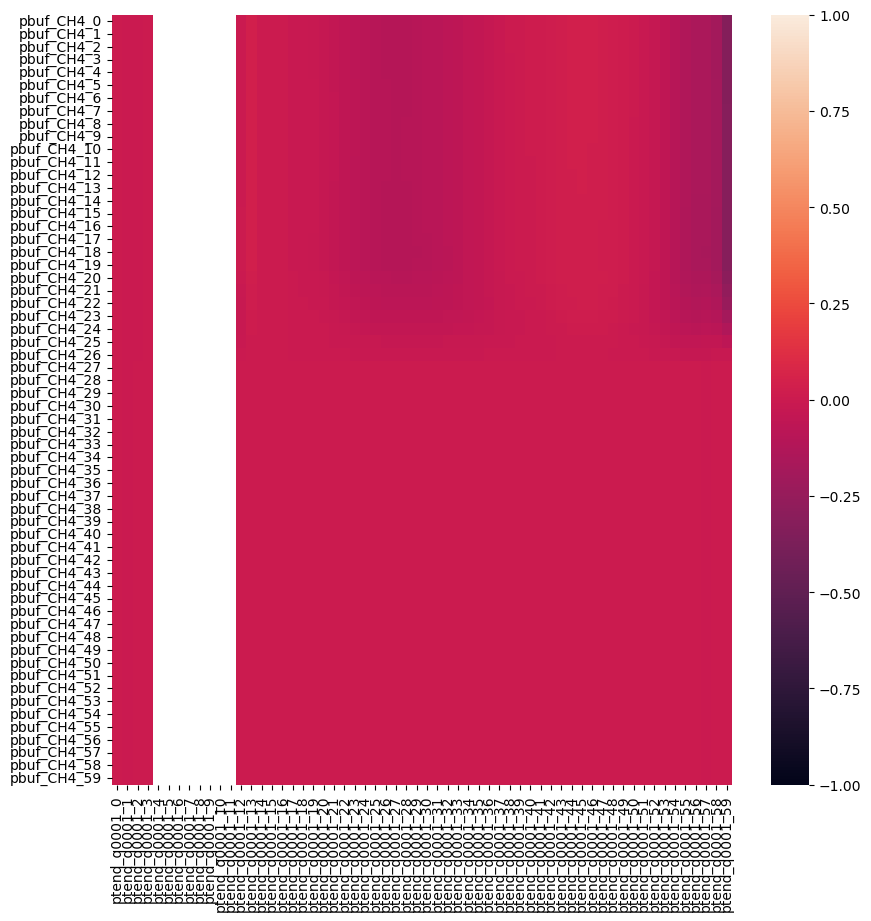

/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


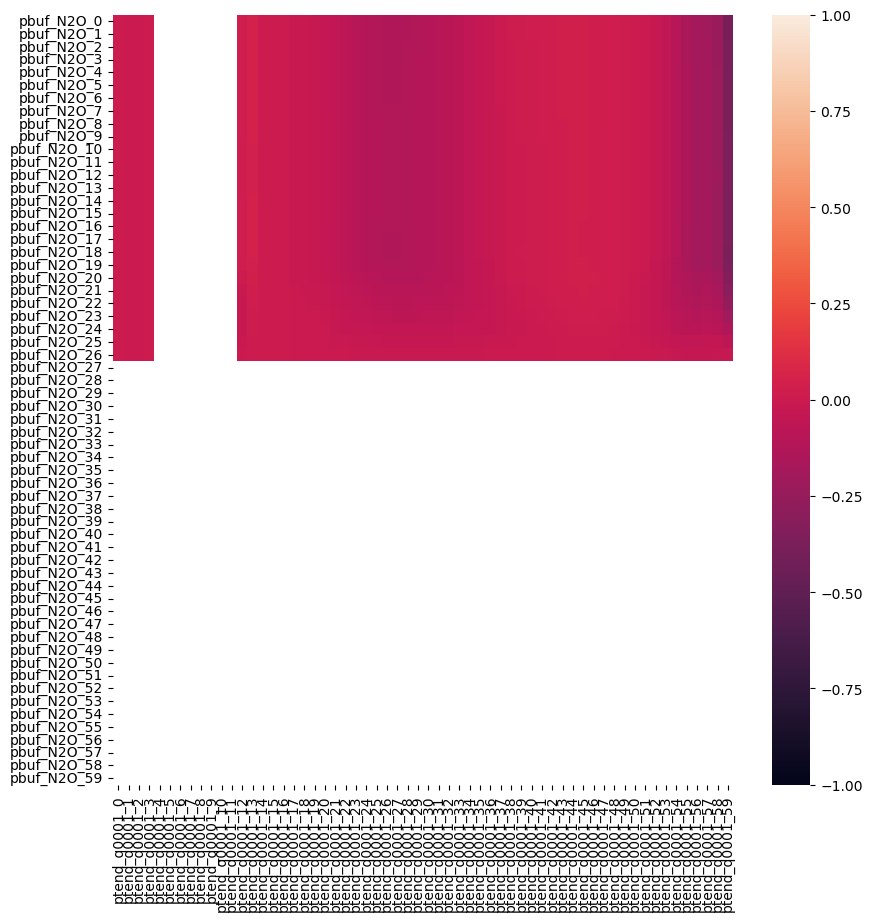

In [7]:
col = "ptend_q0001"
out_cols = [f"{col}_{i}" for i in range(60)]
in_cols = IN_SCALAR_COLUMNS
plot_correlation(df, in_cols, out_cols)
for col in IN_VECTOR_COLUMNS:
    in_cols = [f"{col}_{i}" for i in range(60)]
    plot_correlation(df, in_cols, out_cols)

## q0002

/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


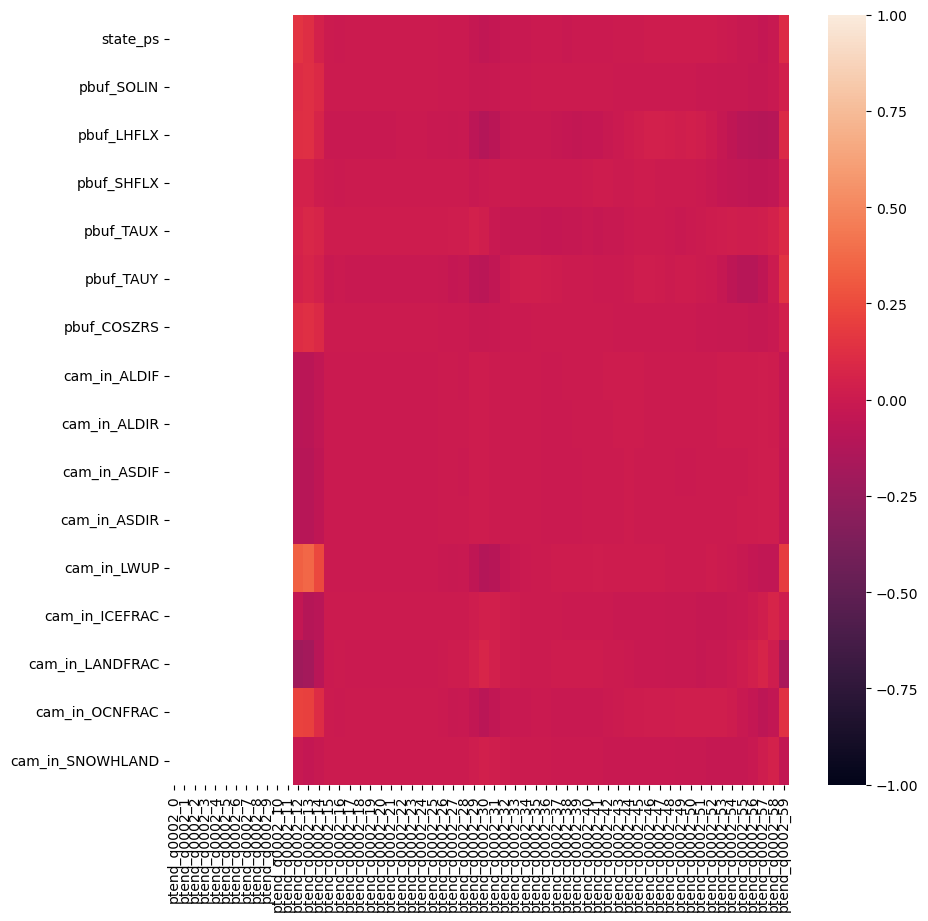

/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


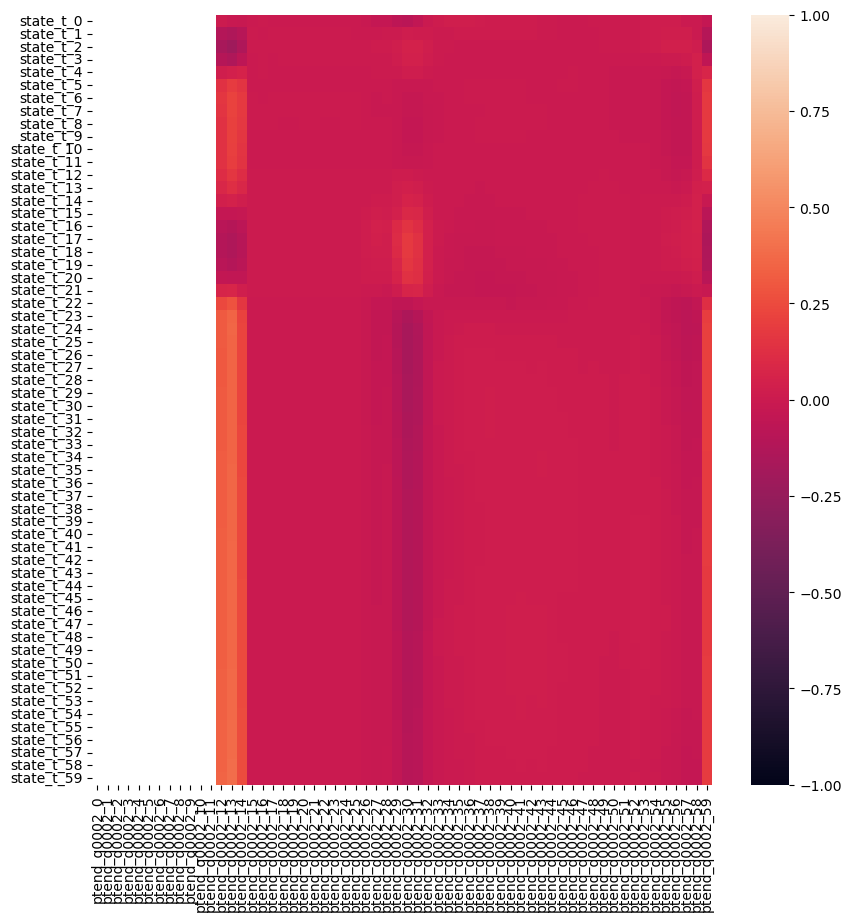

/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


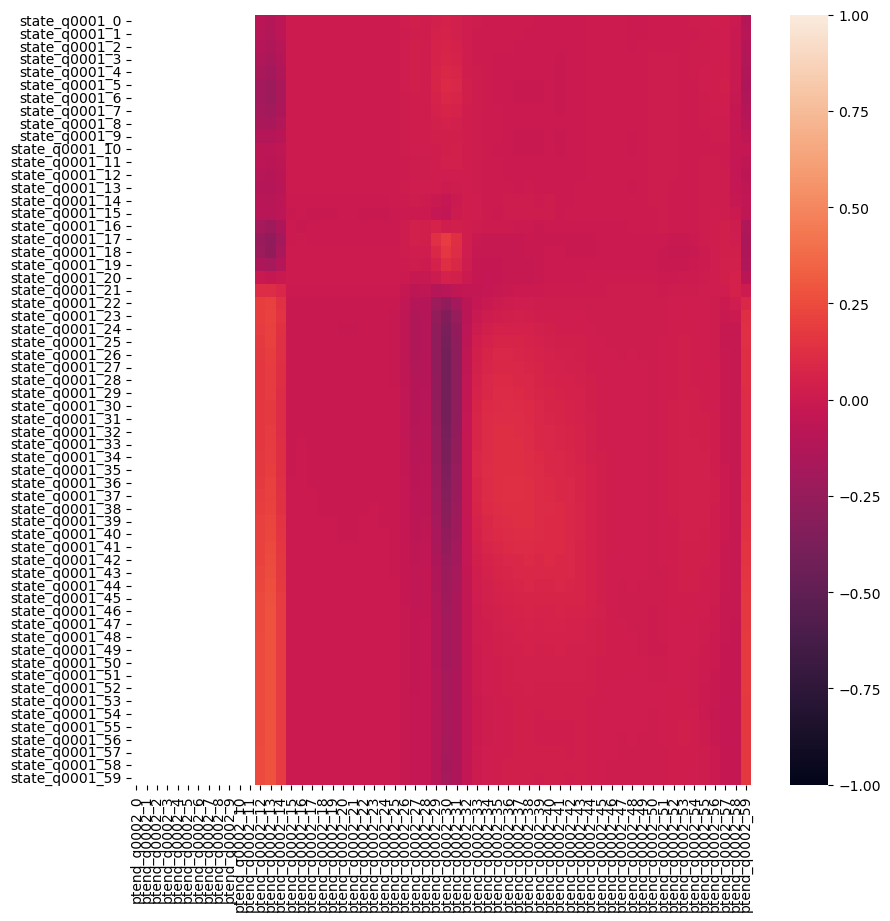

/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


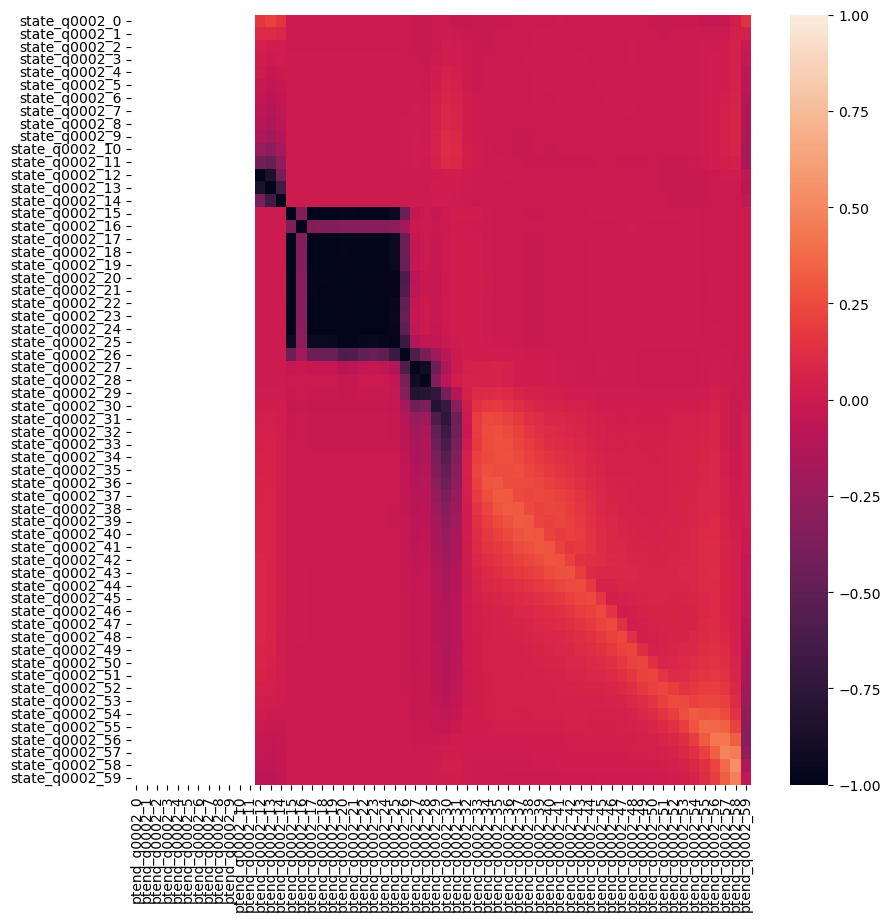

/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


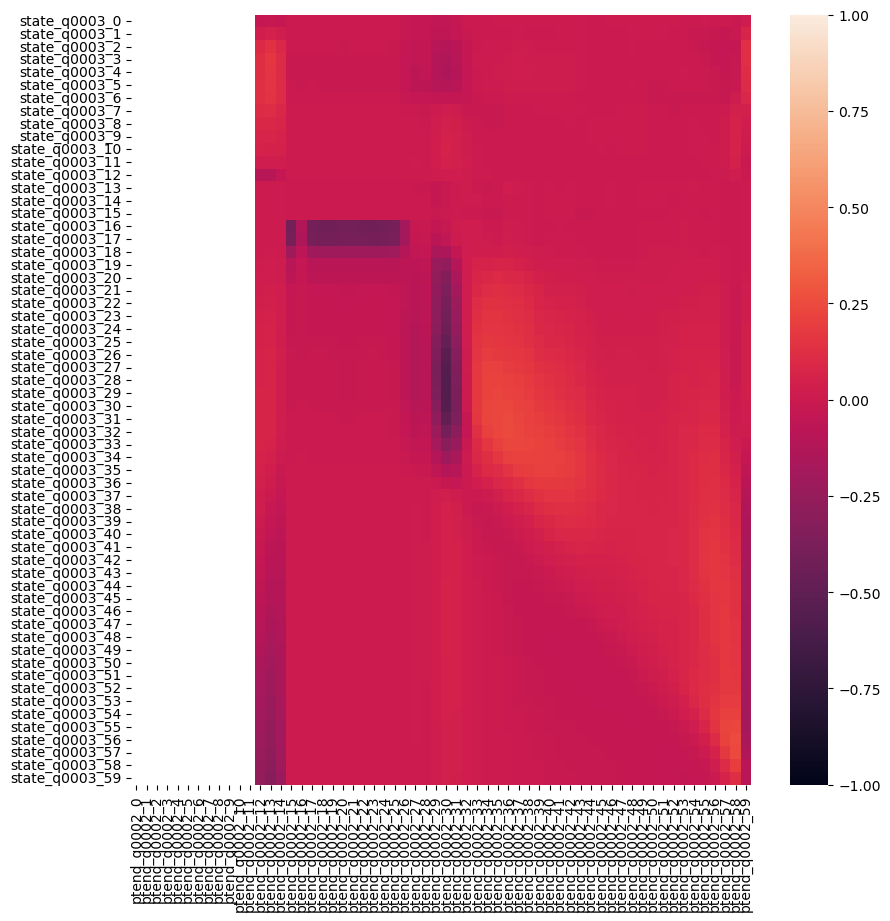

/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


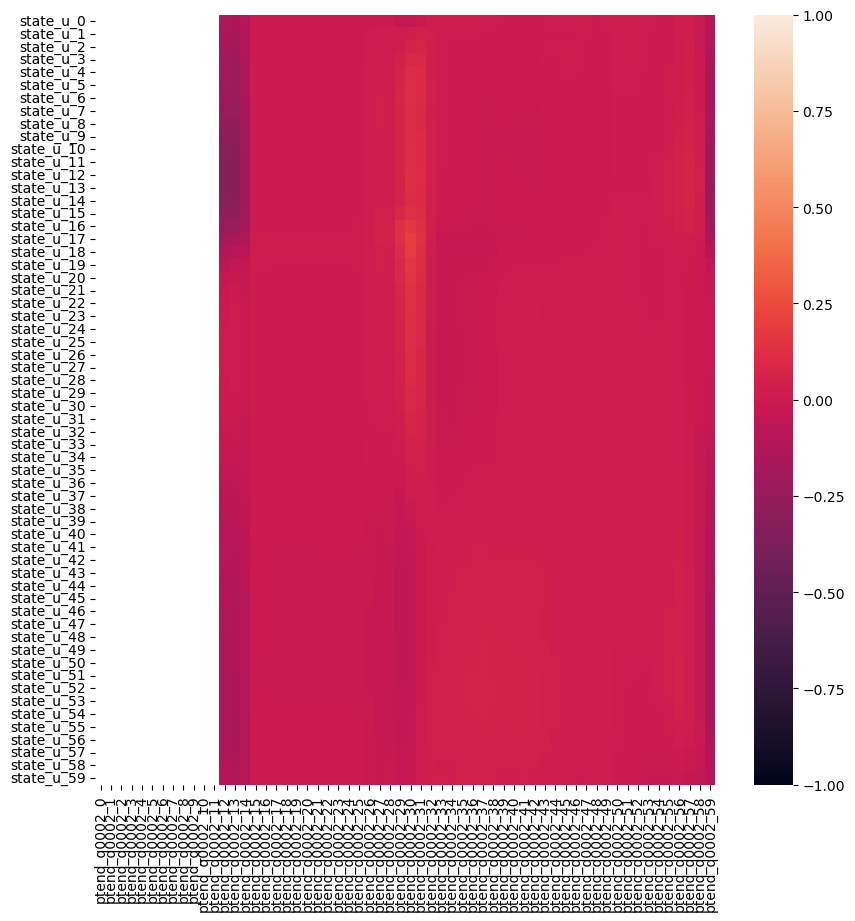

/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


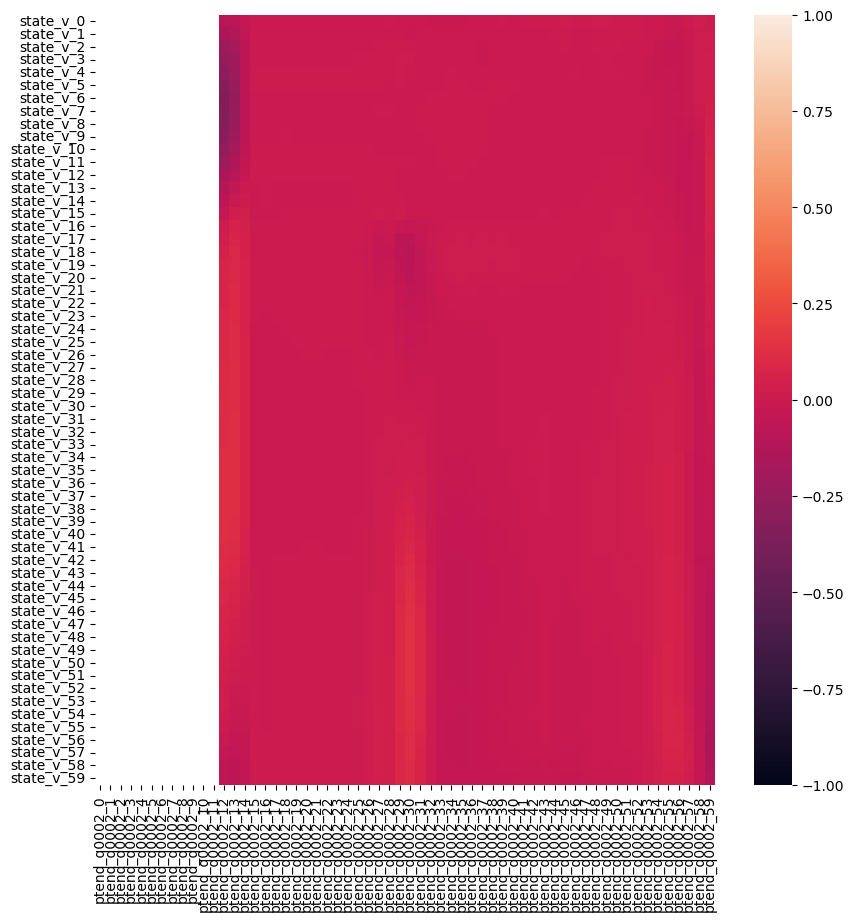

/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


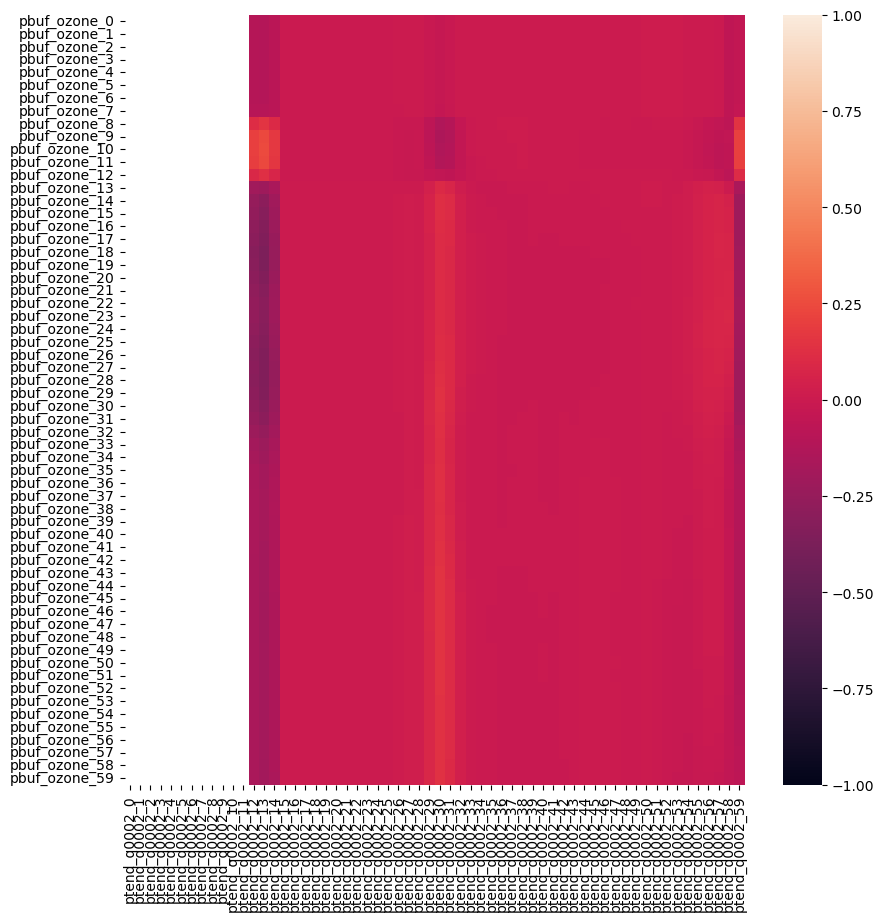

/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


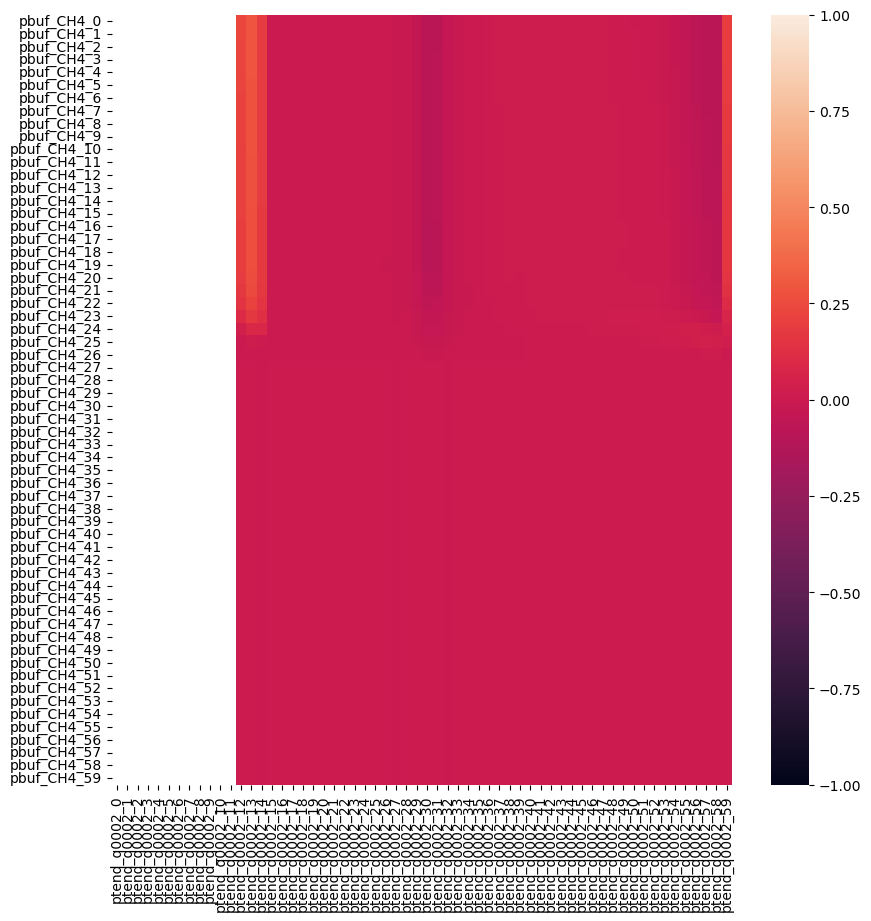

/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


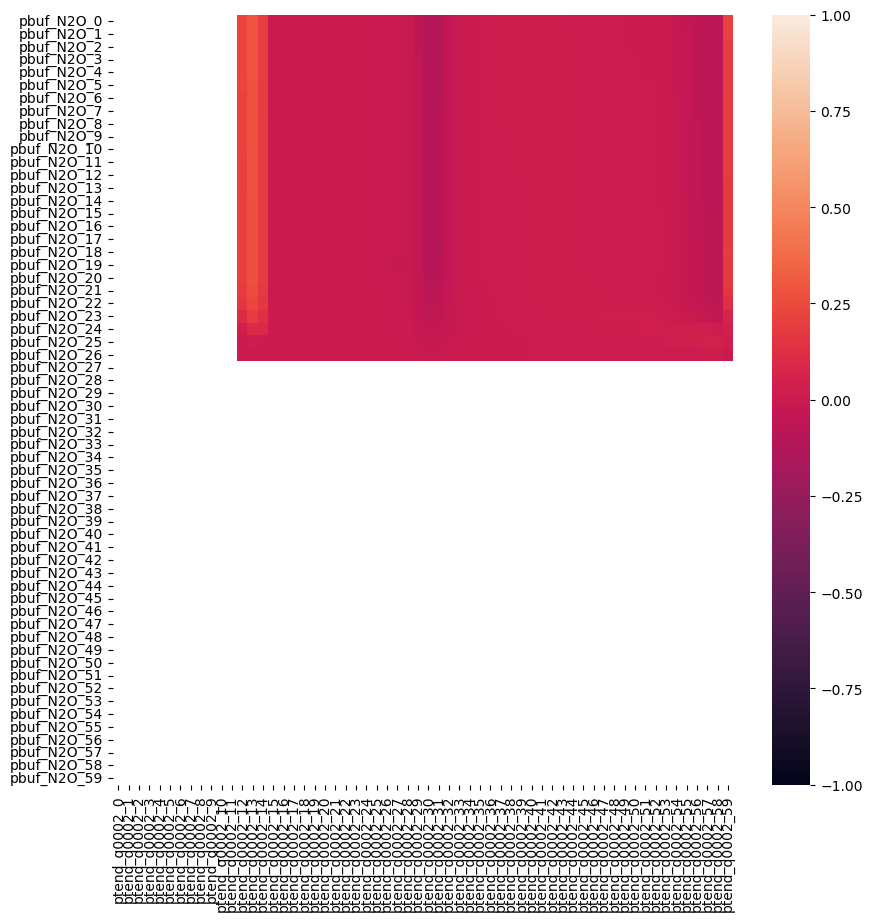

In [8]:
col = "ptend_q0002"
out_cols = [f"{col}_{i}" for i in range(60)]
in_cols = IN_SCALAR_COLUMNS
plot_correlation(df, in_cols, out_cols)
for col in IN_VECTOR_COLUMNS:
    in_cols = [f"{col}_{i}" for i in range(60)]
    plot_correlation(df, in_cols, out_cols)

## q0003

/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


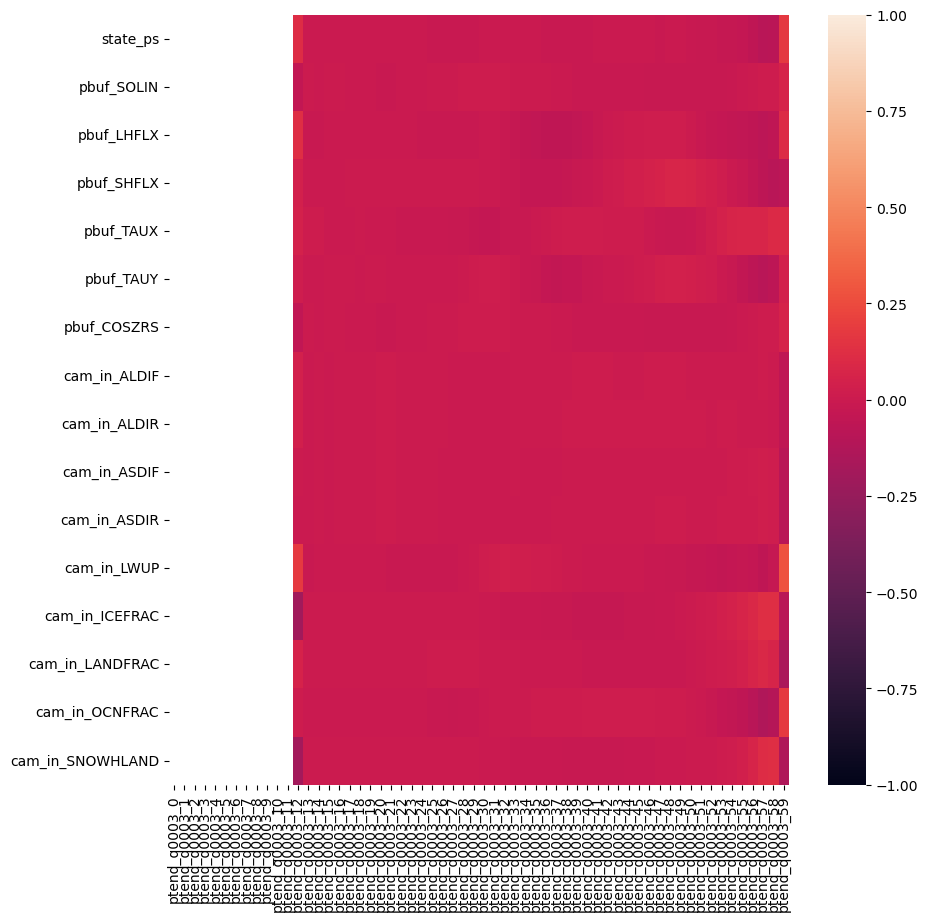

/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


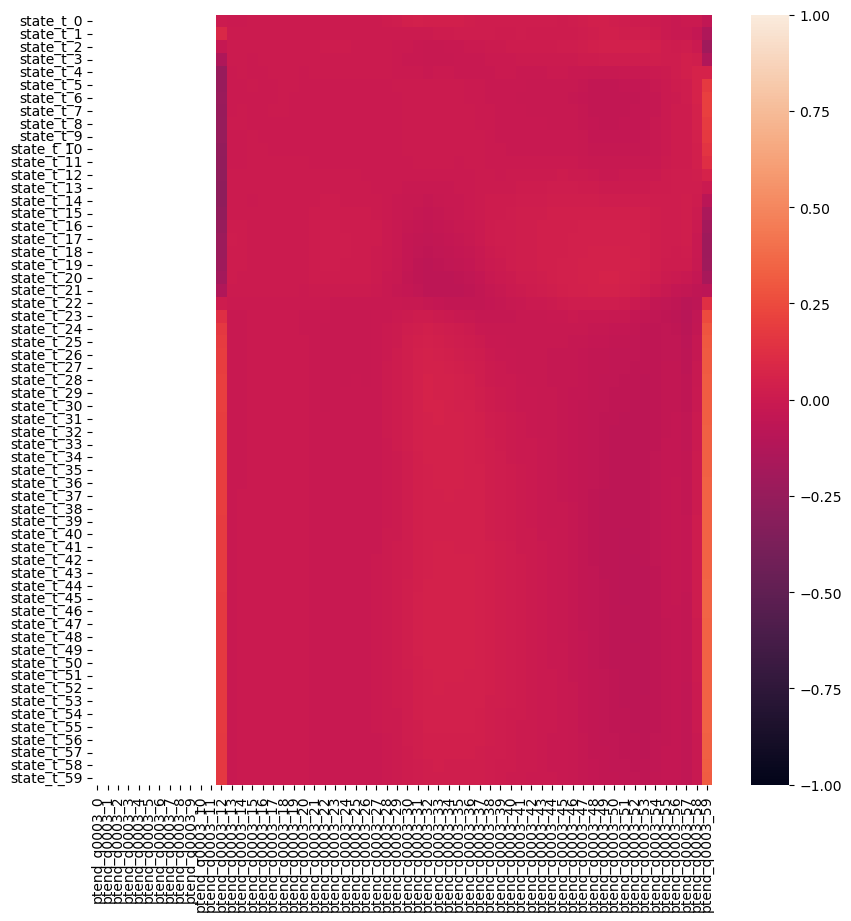

/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


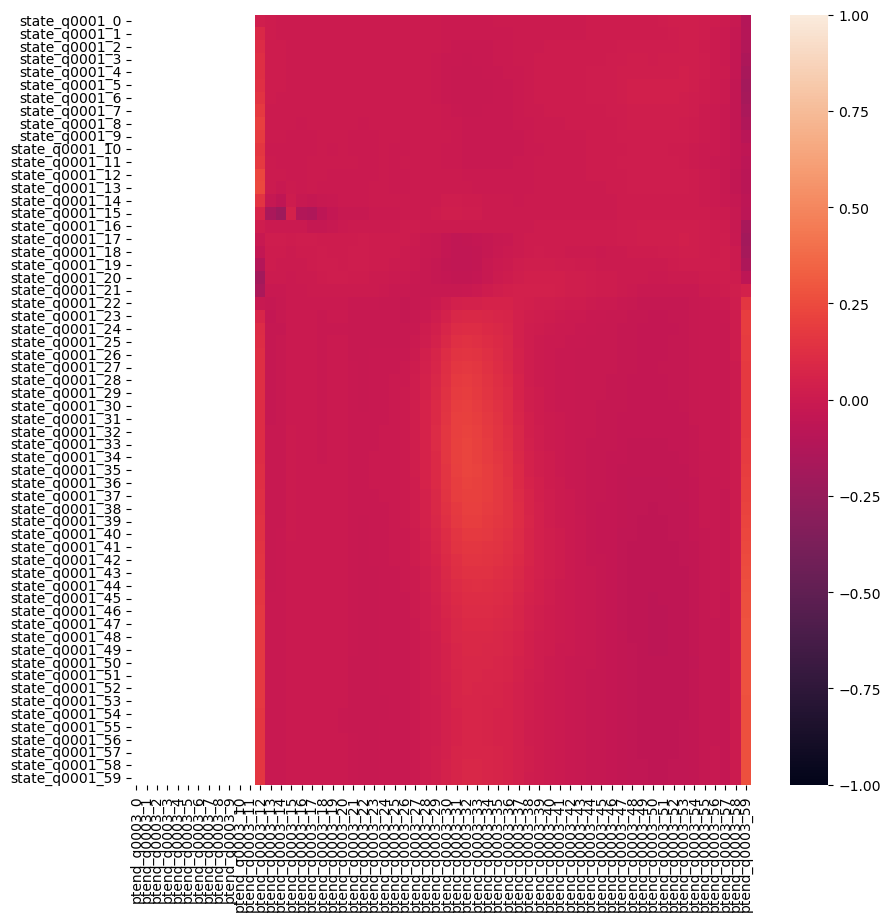

/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


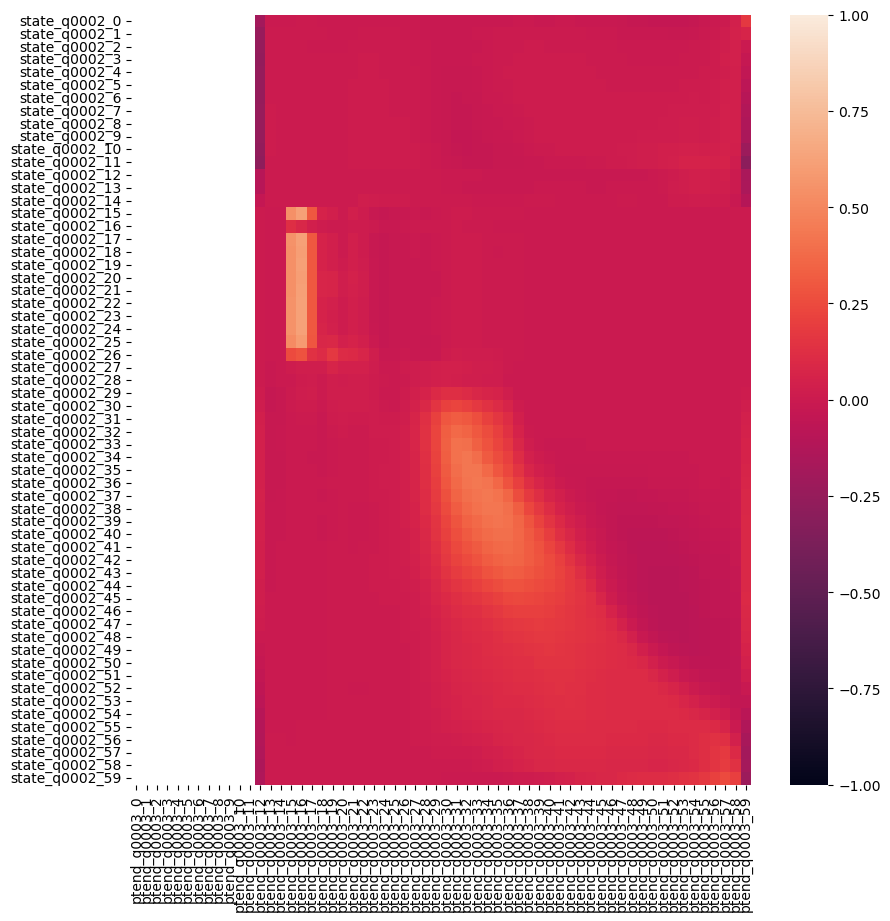

/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


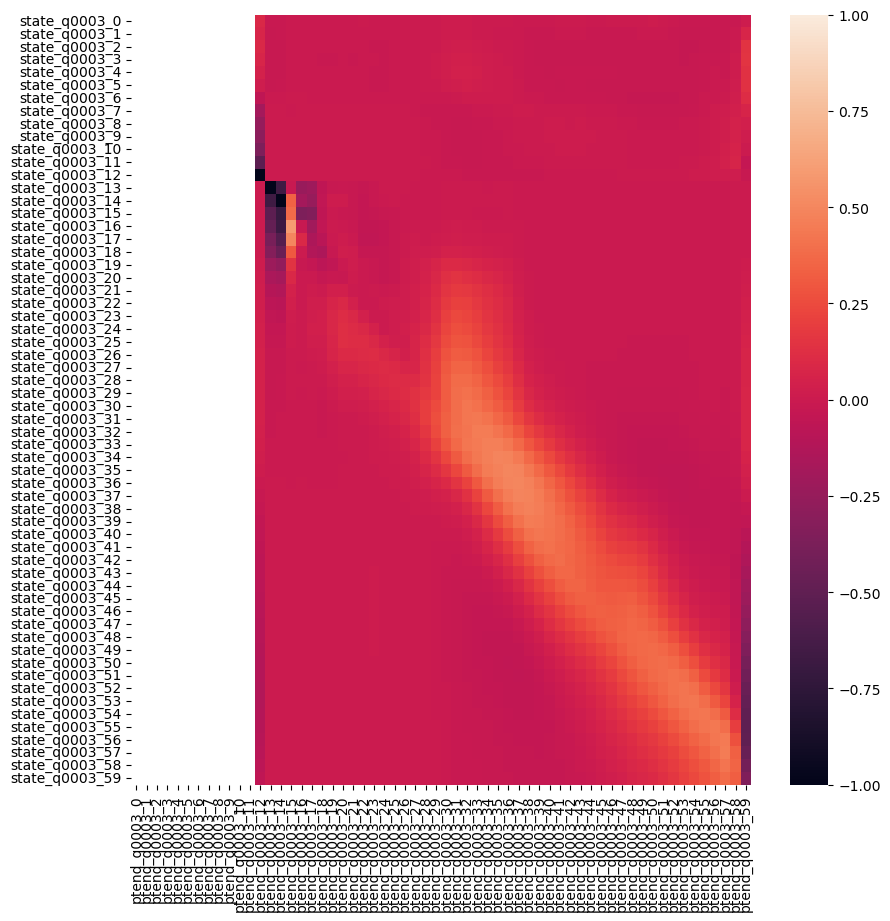

/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


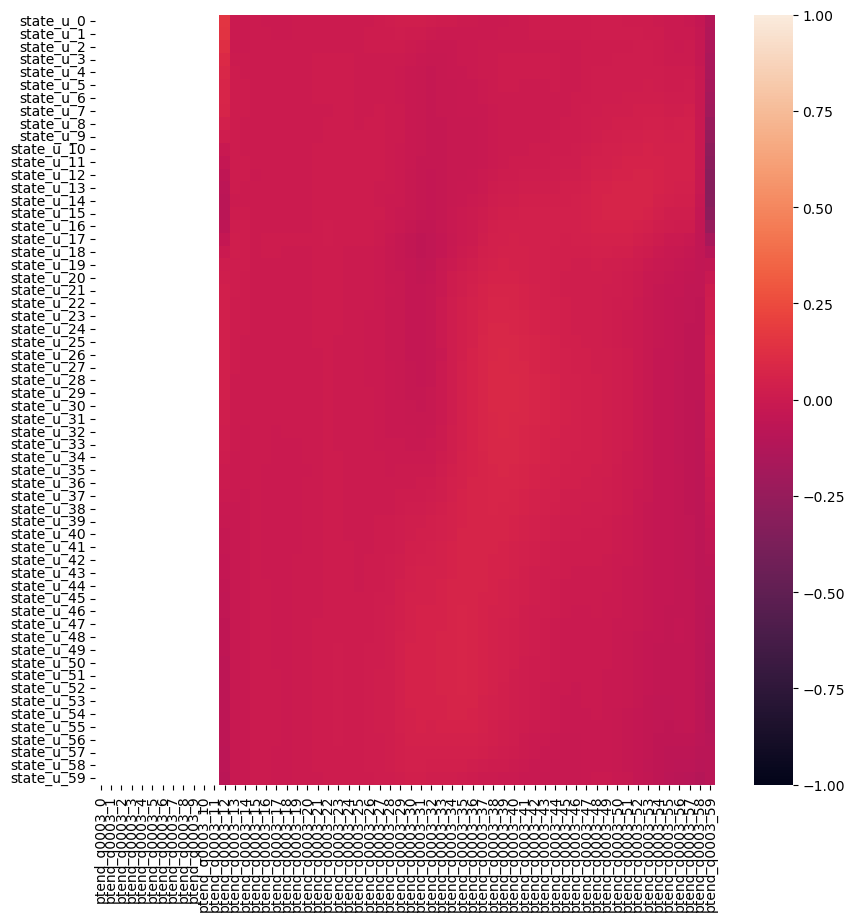

/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


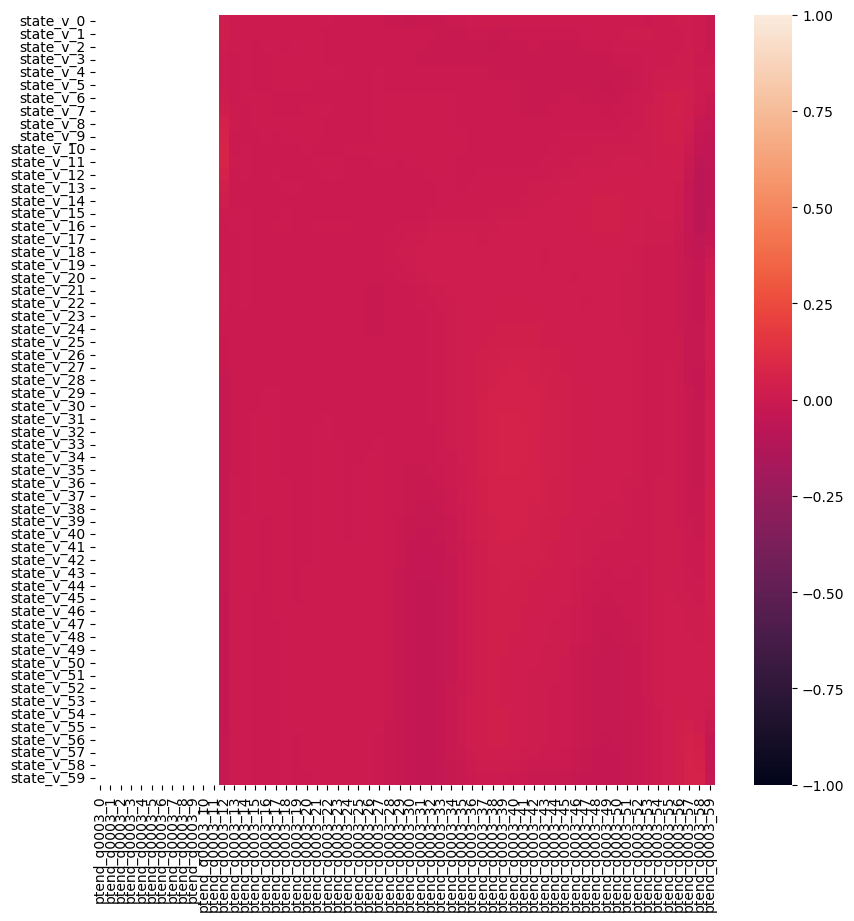

/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


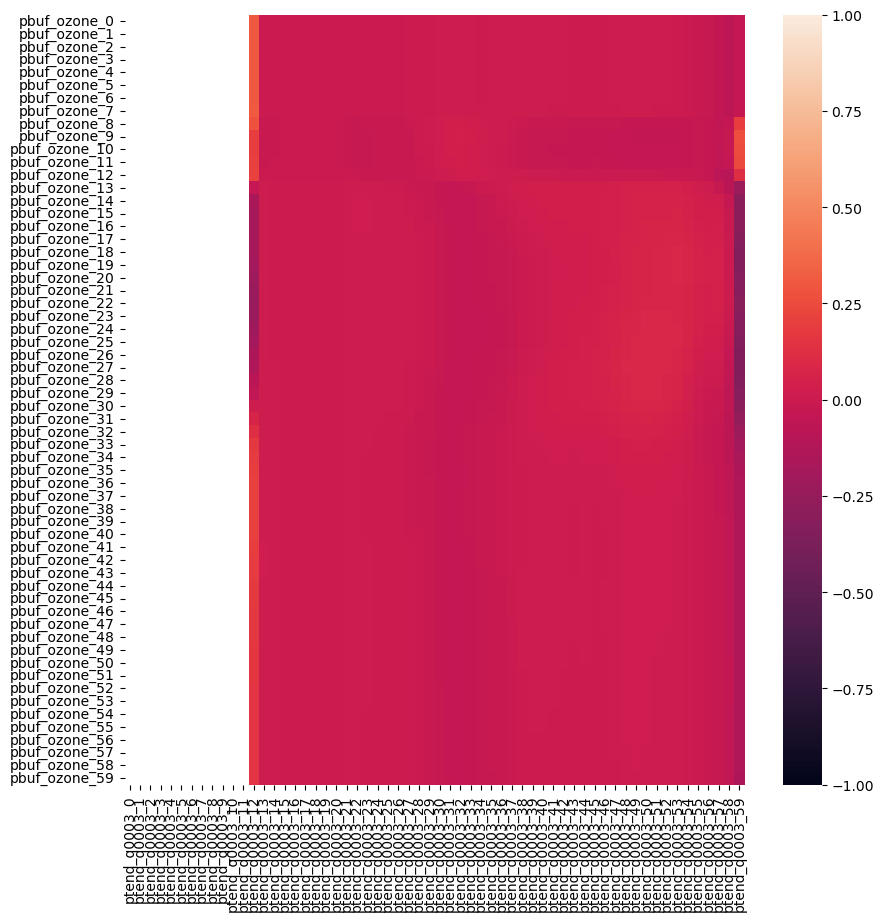

/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/user/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


In [ ]:
col = "ptend_q0003"
out_cols = [f"{col}_{i}" for i in range(60)]
in_cols = IN_SCALAR_COLUMNS
plot_correlation(df, in_cols, out_cols)
for col in IN_VECTOR_COLUMNS:
    in_cols = [f"{col}_{i}" for i in range(60)]
    plot_correlation(df, in_cols, out_cols)

## ptend_u

/opt/mamba/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/mamba/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


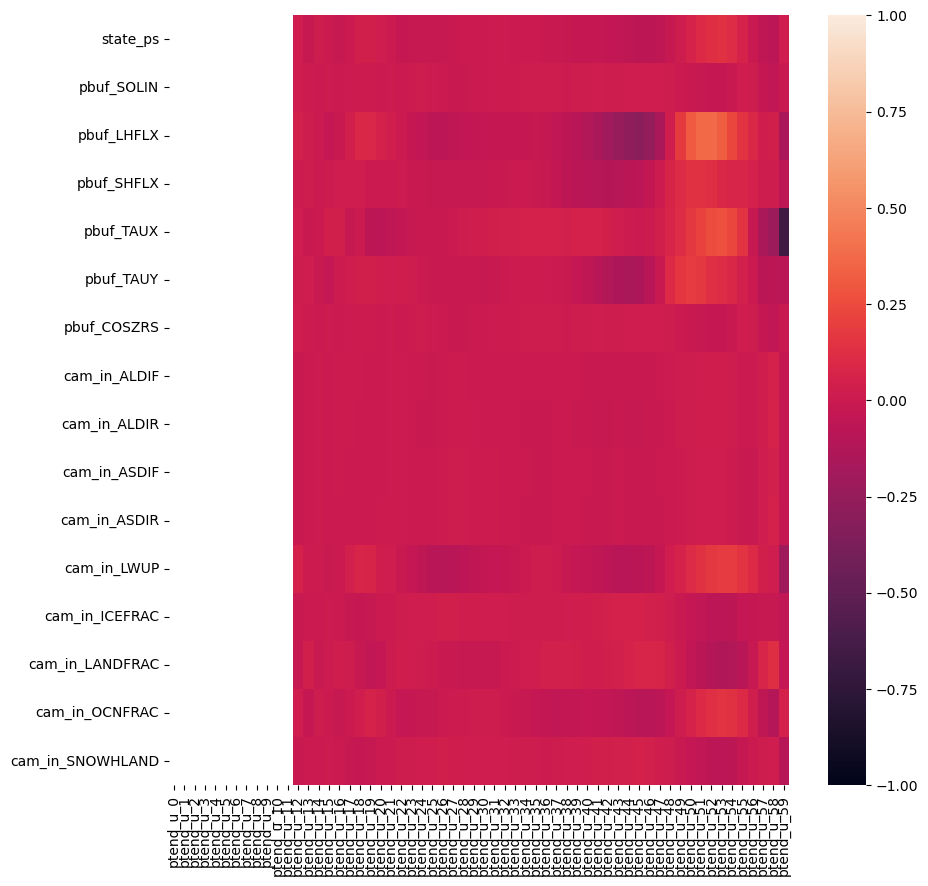

/opt/mamba/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/mamba/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


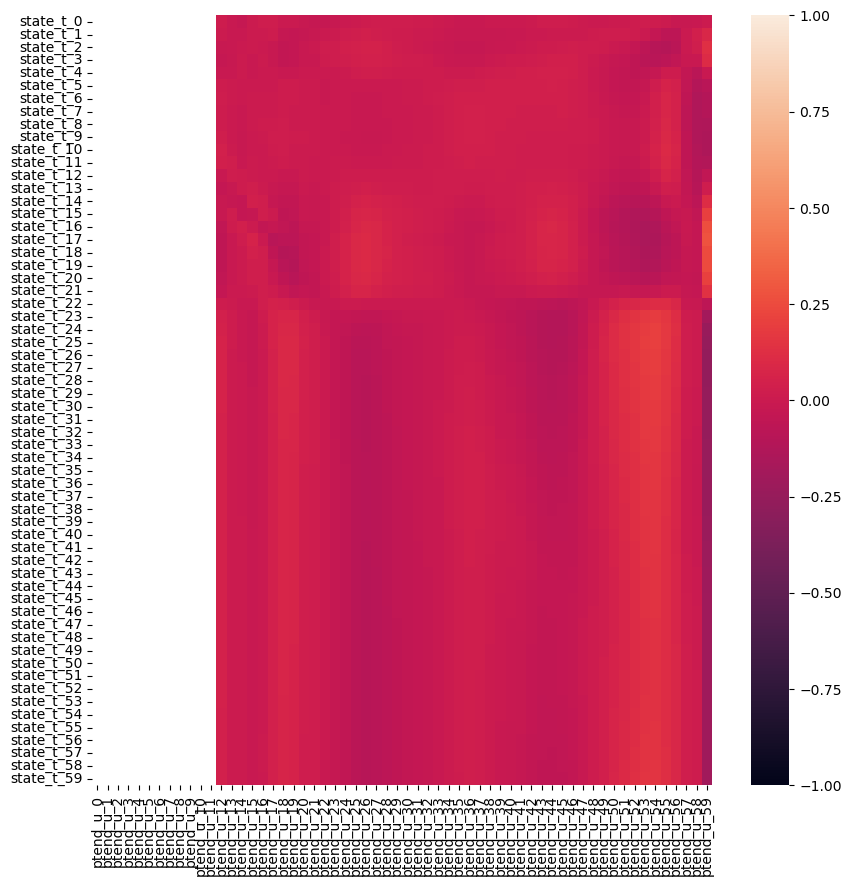

/opt/mamba/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/mamba/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


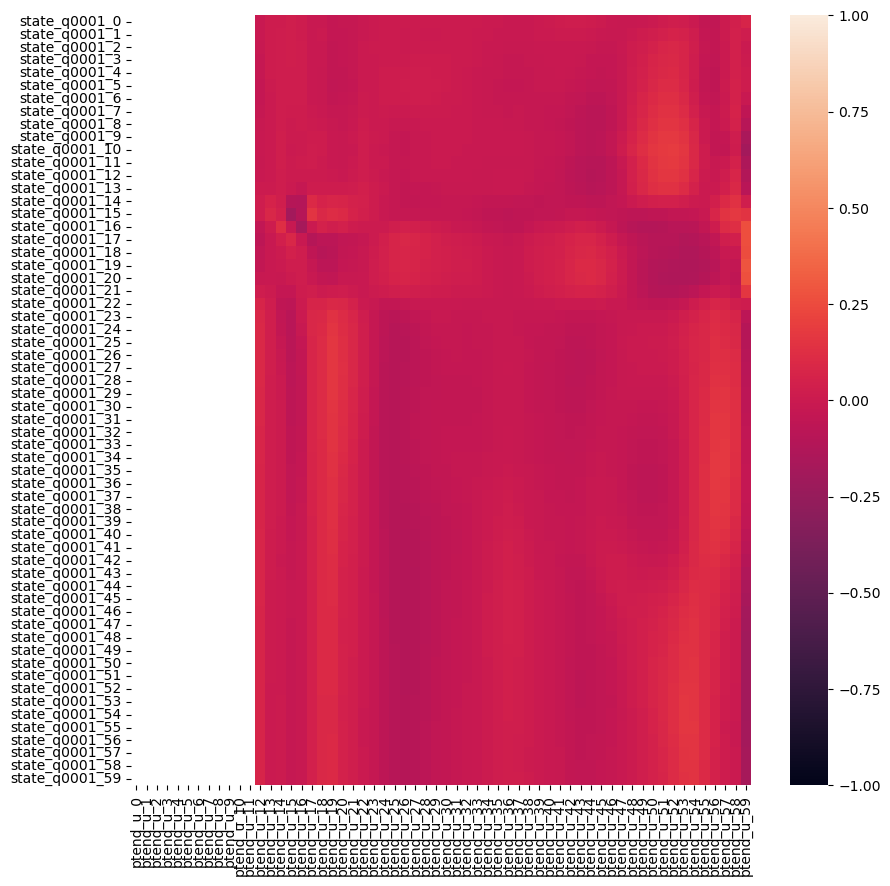

/opt/mamba/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/mamba/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


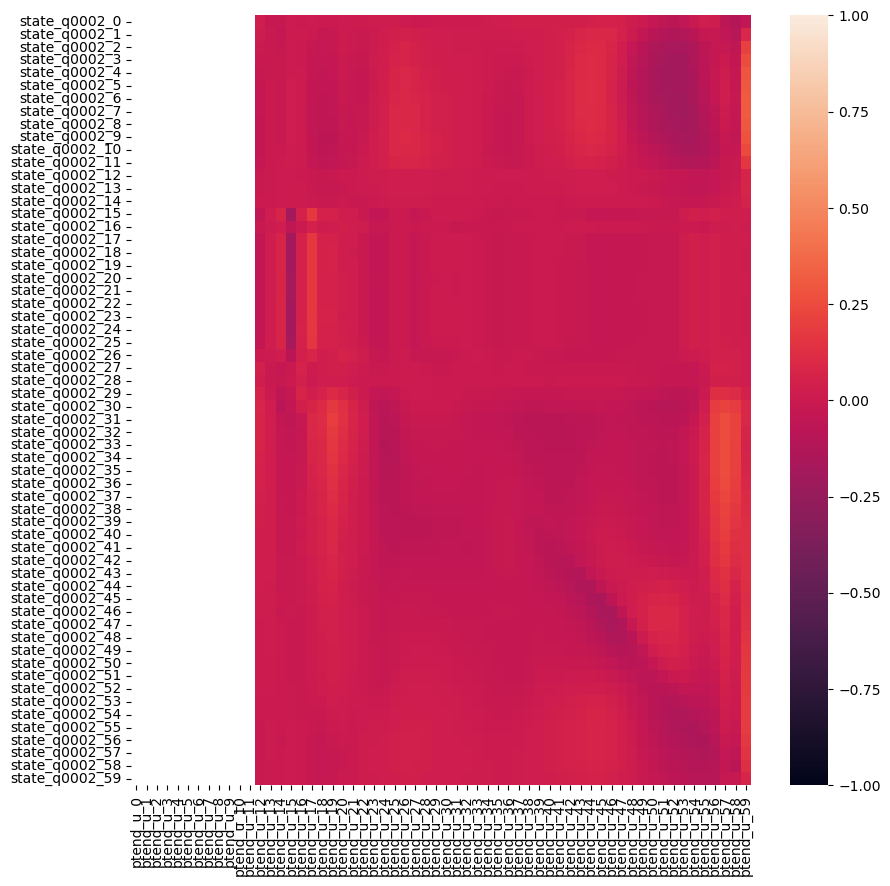

/opt/mamba/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/mamba/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


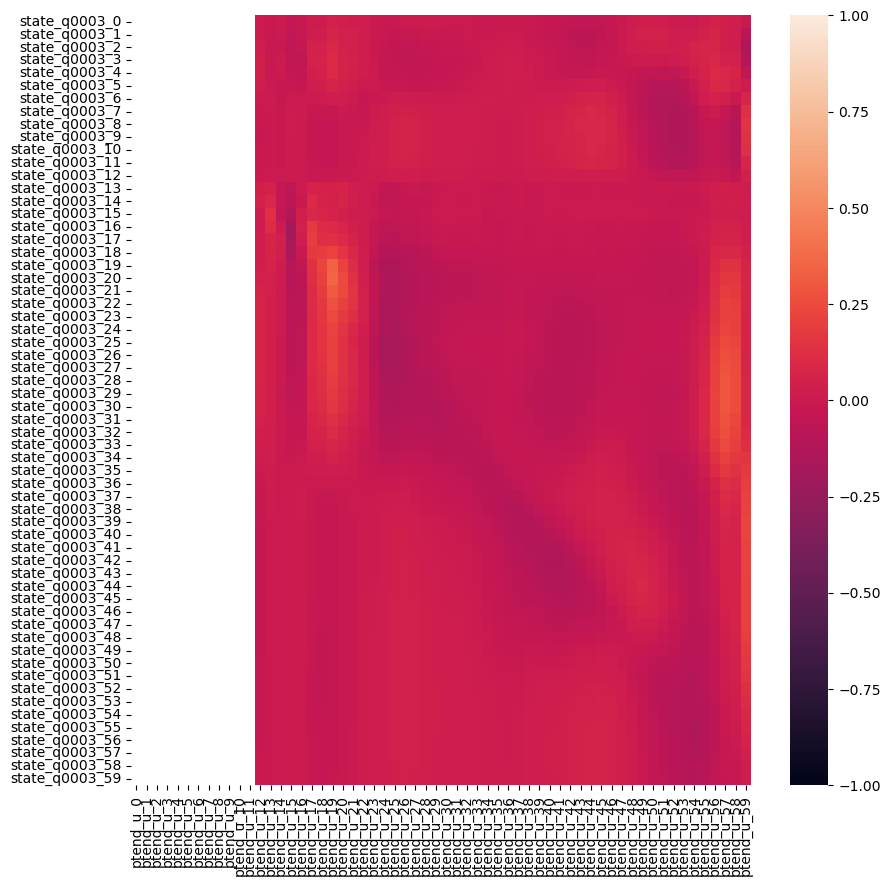

/opt/mamba/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/mamba/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


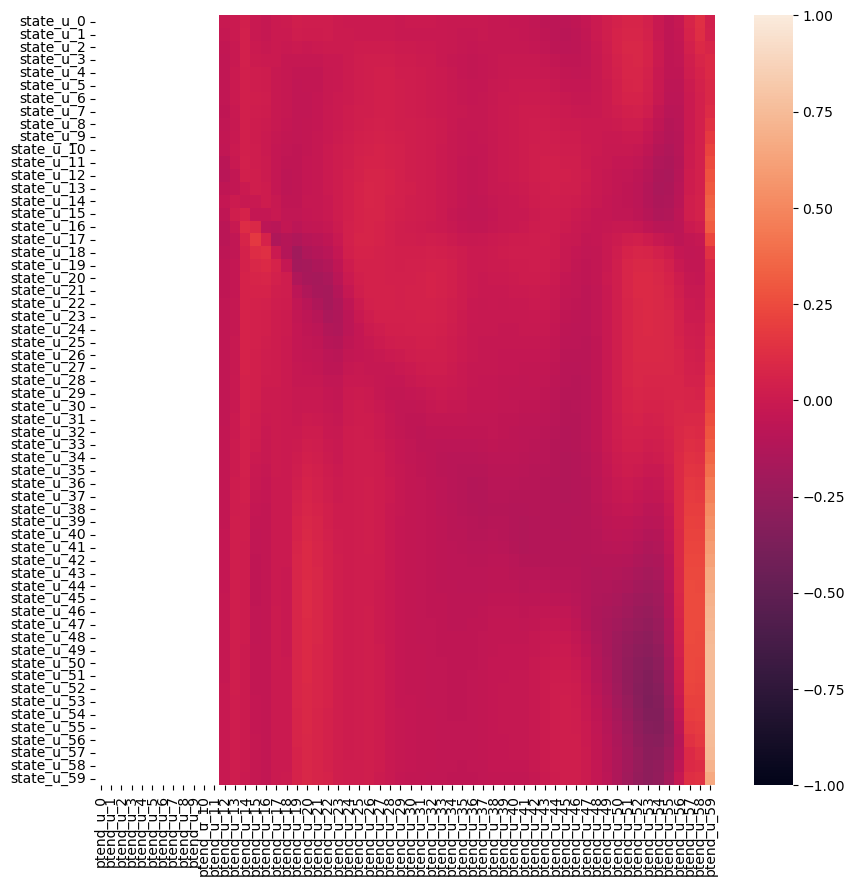

/opt/mamba/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/mamba/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


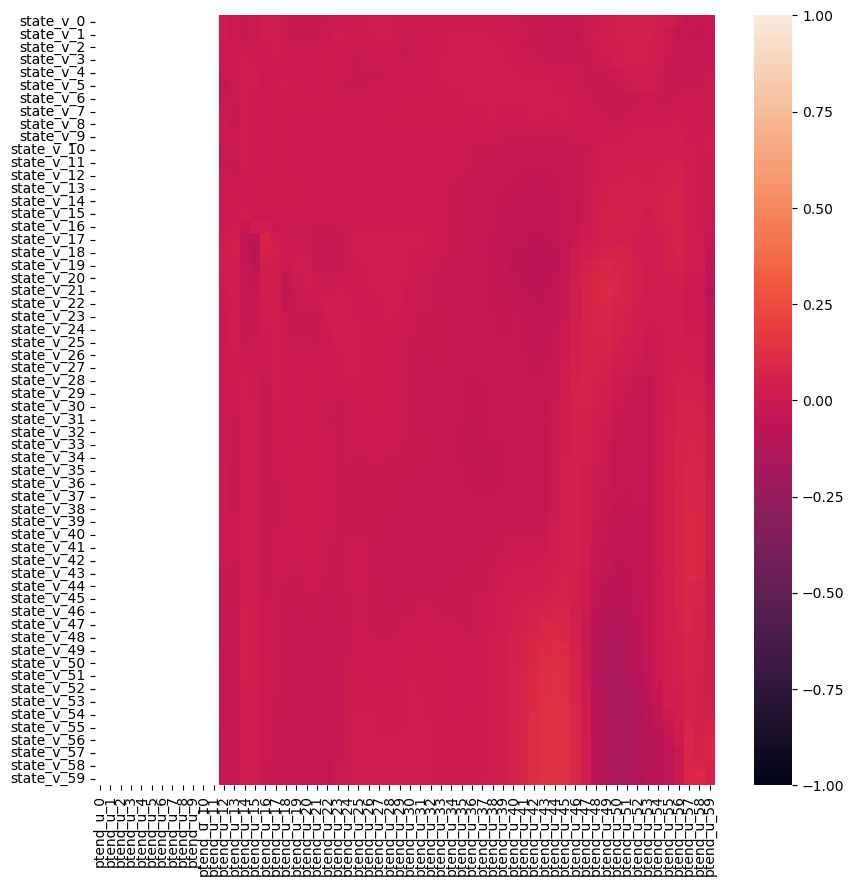

/opt/mamba/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/mamba/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


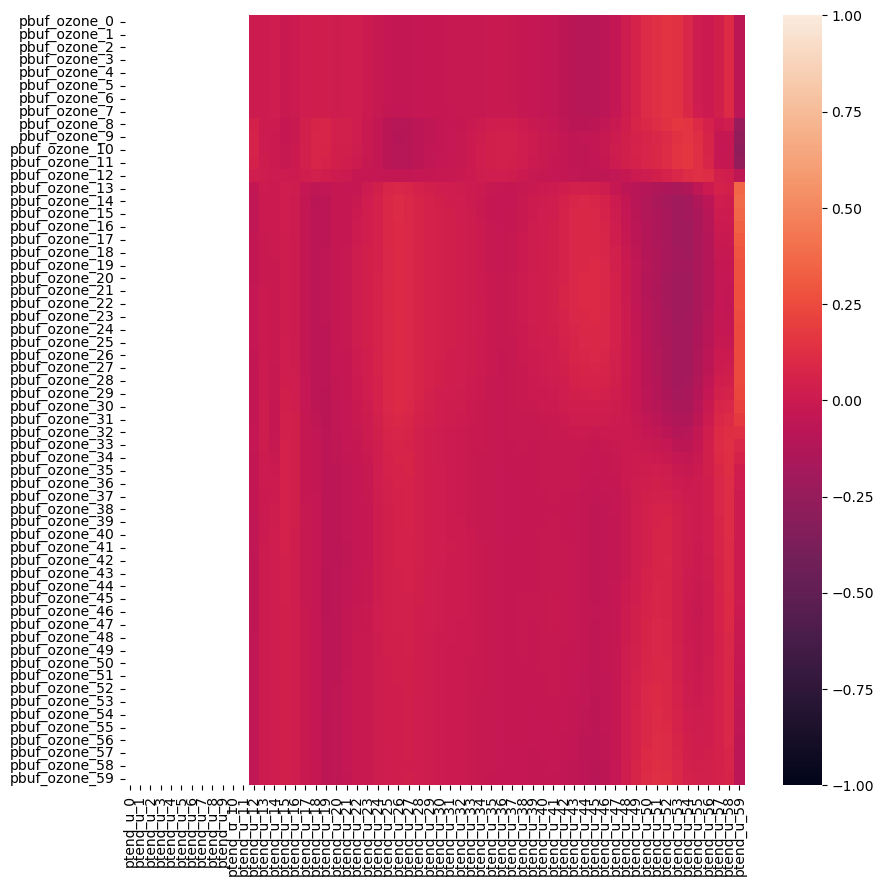

/opt/mamba/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/mamba/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


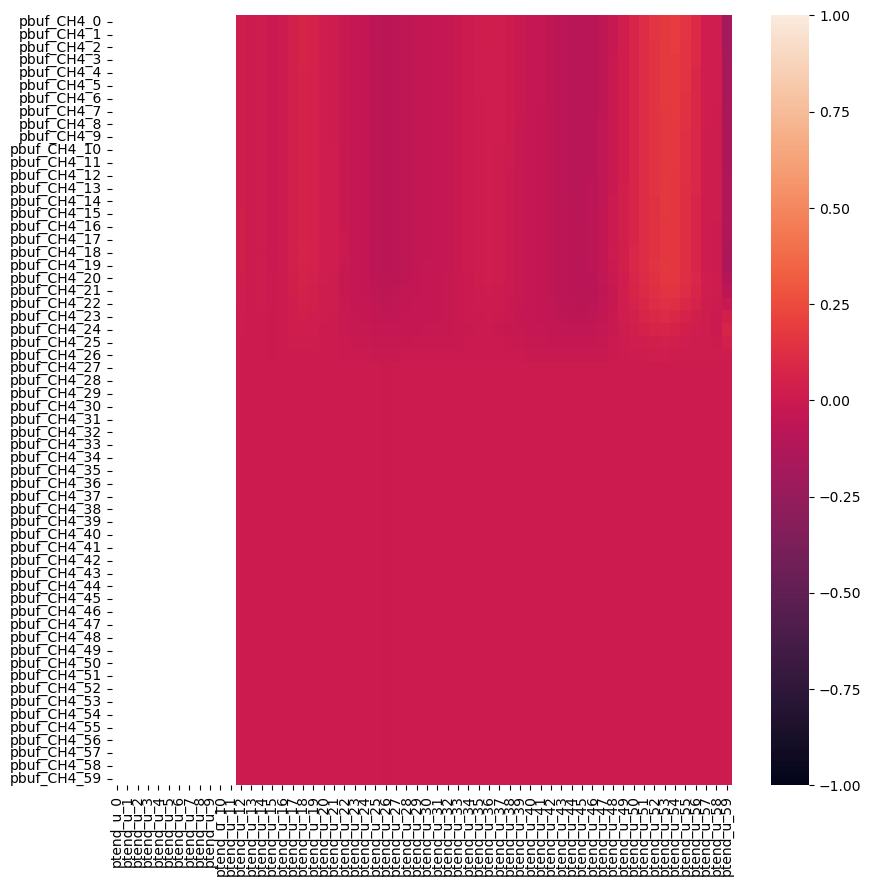

/opt/mamba/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/mamba/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


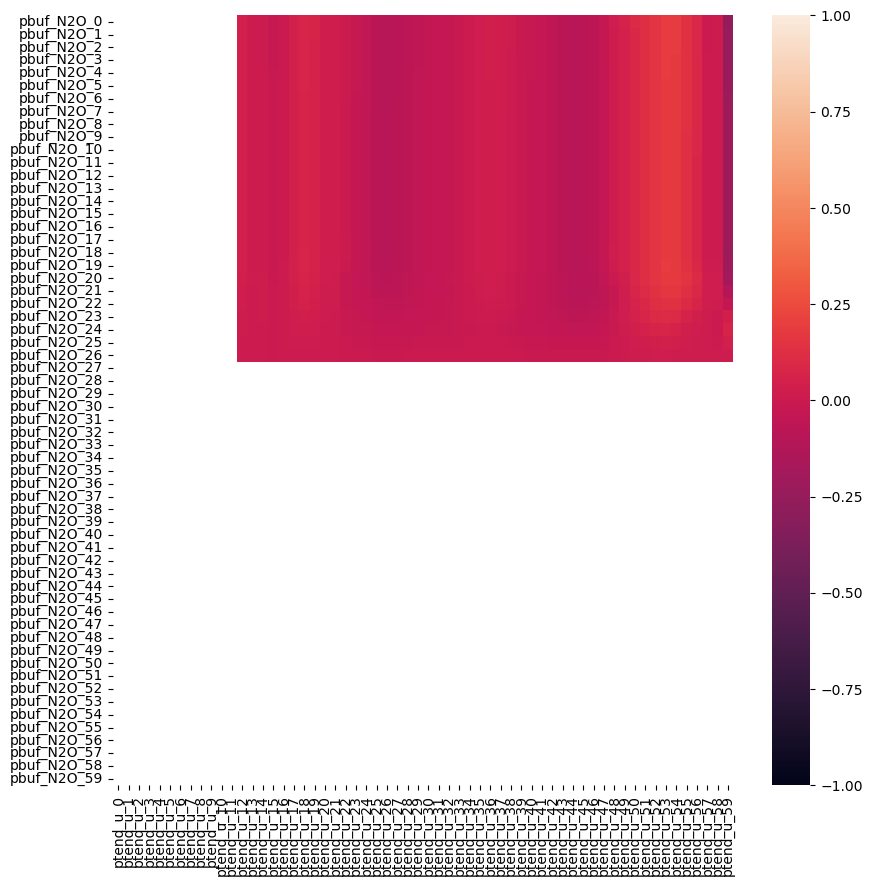

In [183]:
col = "ptend_u"
out_cols = [f"{col}_{i}" for i in range(60)]
in_cols = IN_SCALAR_COLUMNS
plot_correlation(df, in_cols, out_cols)
for col in IN_VECTOR_COLUMNS:
    in_cols = [f"{col}_{i}" for i in range(60)]
    plot_correlation(df, in_cols, out_cols)

## ptend_v

/opt/mamba/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/mamba/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


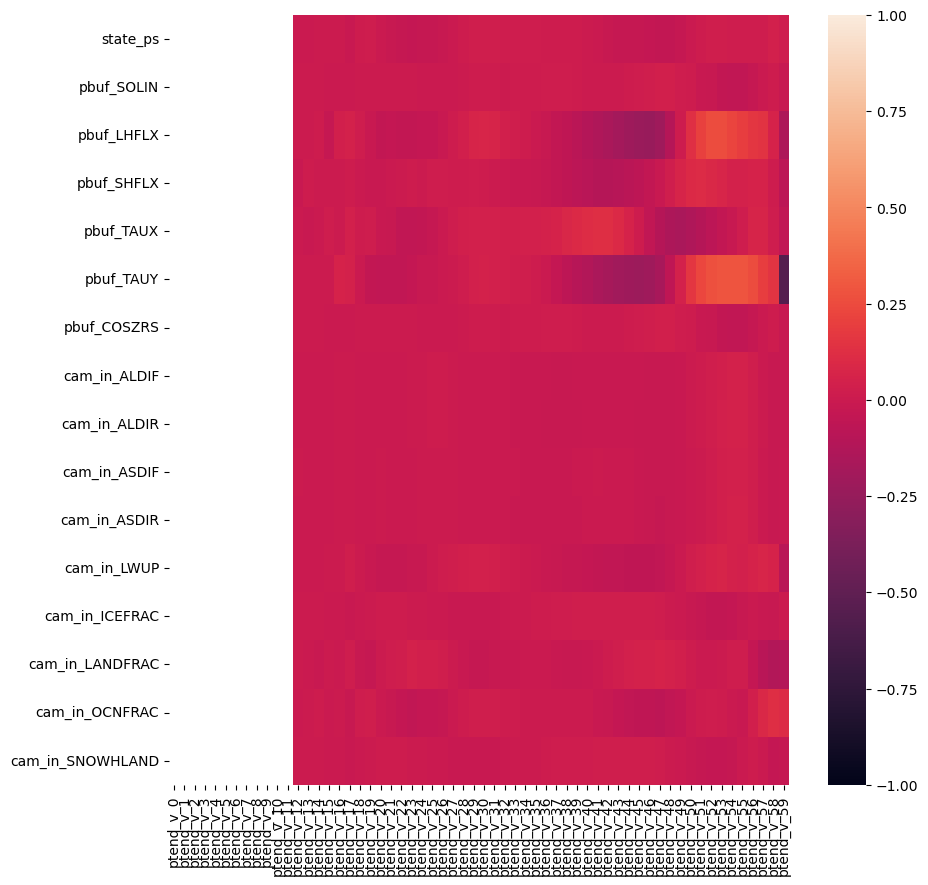

/opt/mamba/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/mamba/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


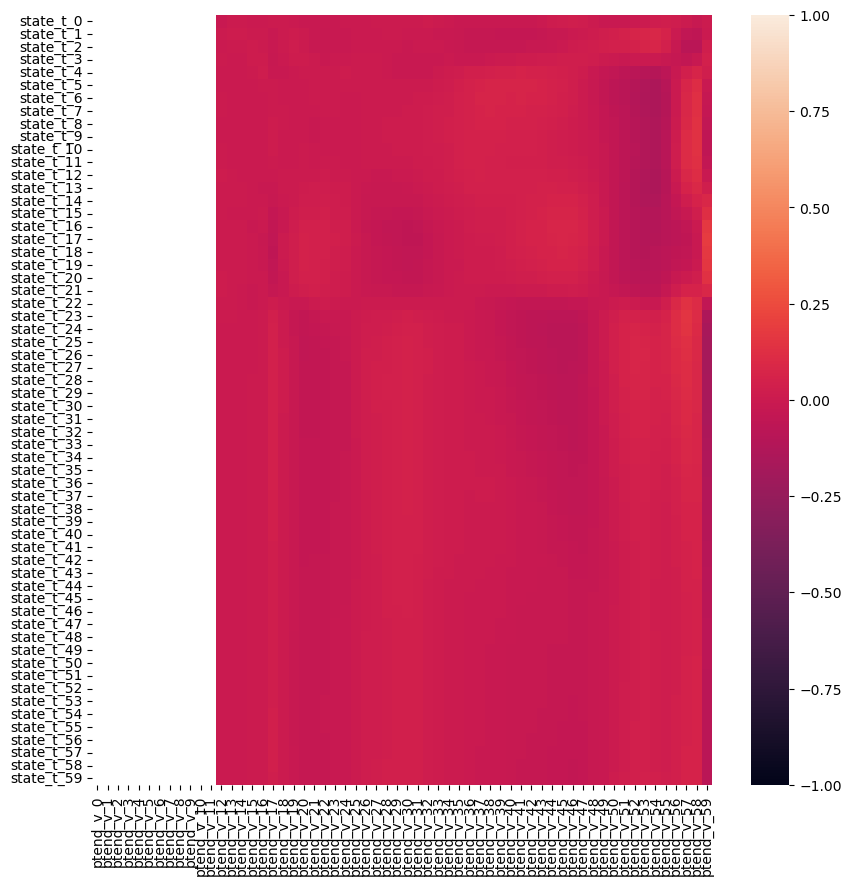

/opt/mamba/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/mamba/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


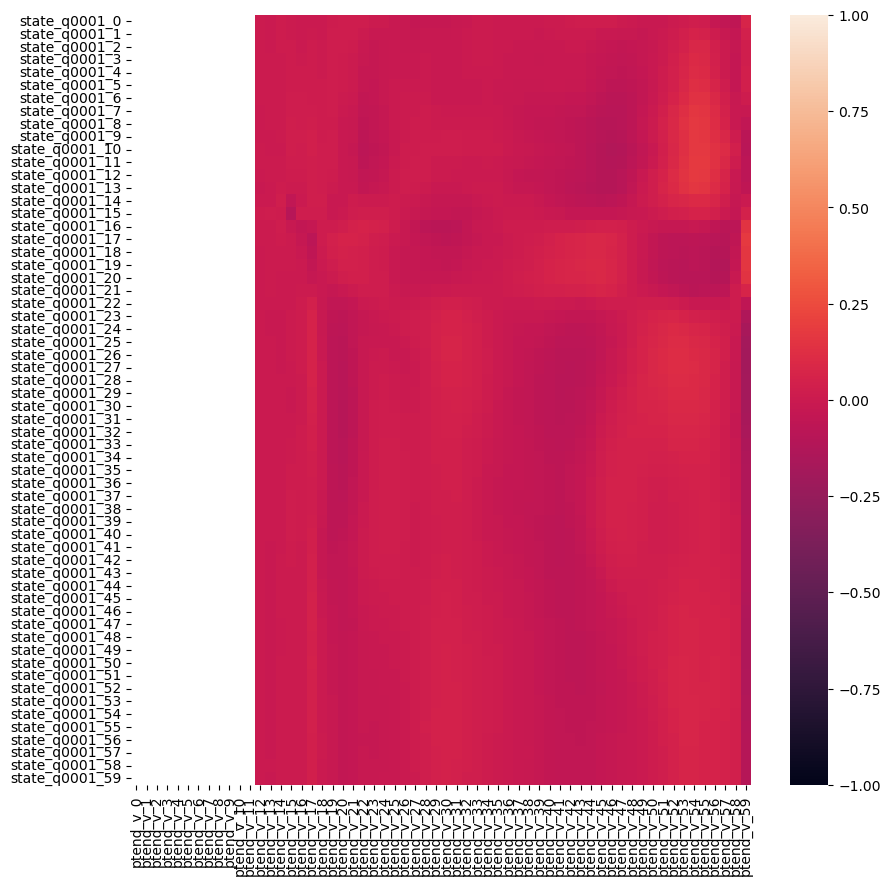

/opt/mamba/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/mamba/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


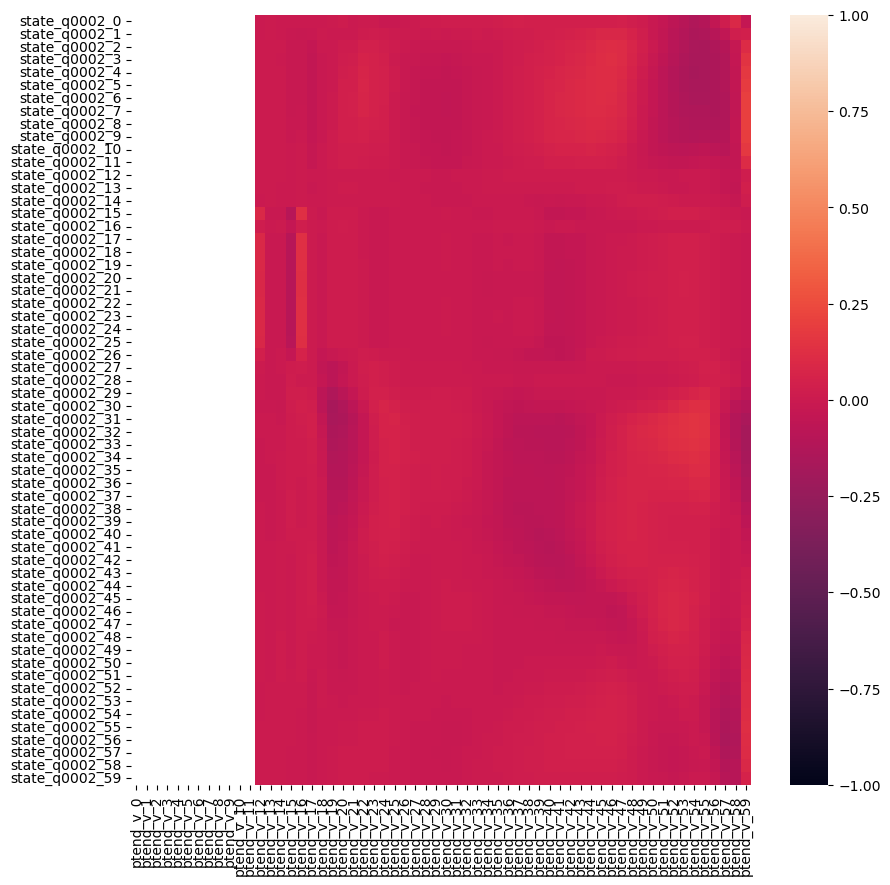

/opt/mamba/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/mamba/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


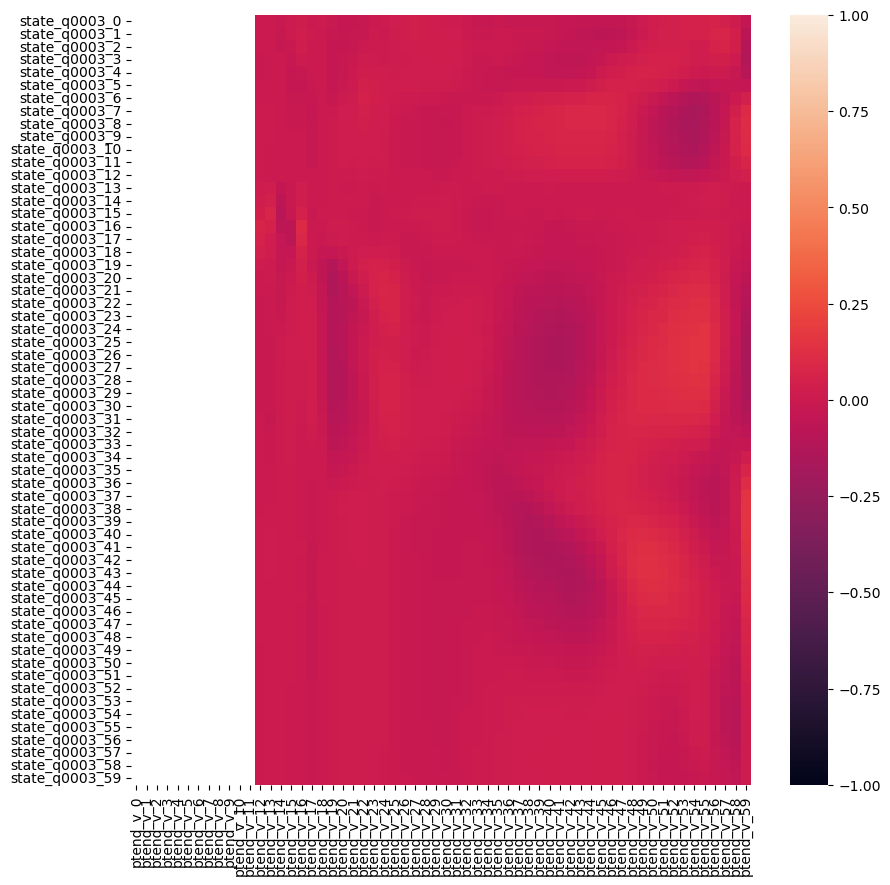

/opt/mamba/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/mamba/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


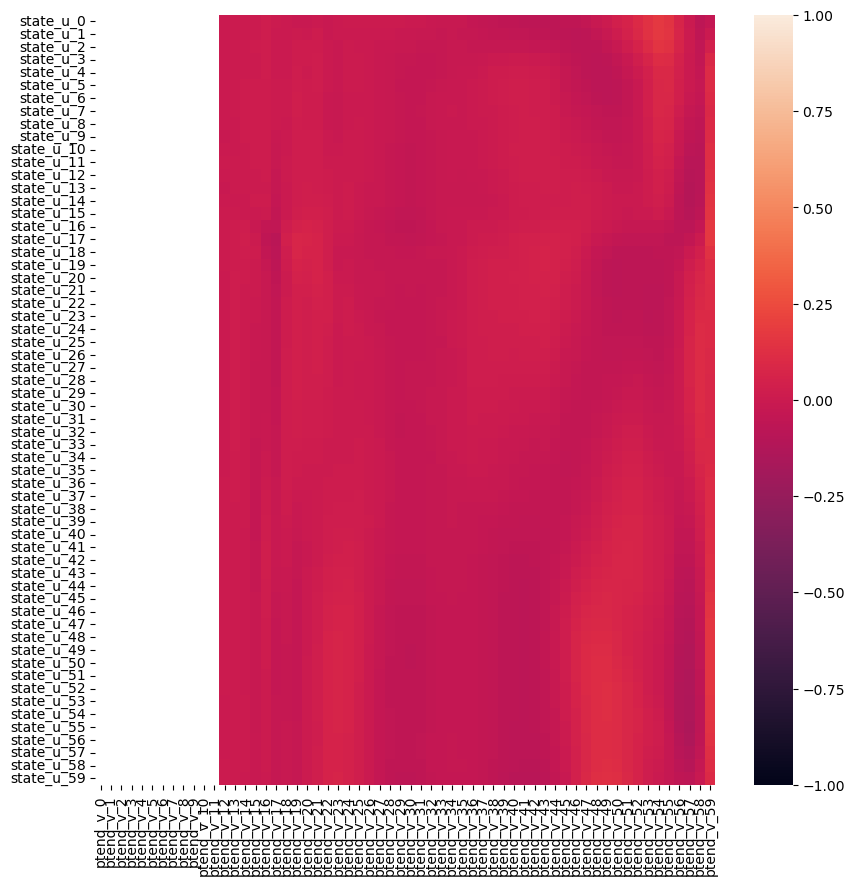

/opt/mamba/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/mamba/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


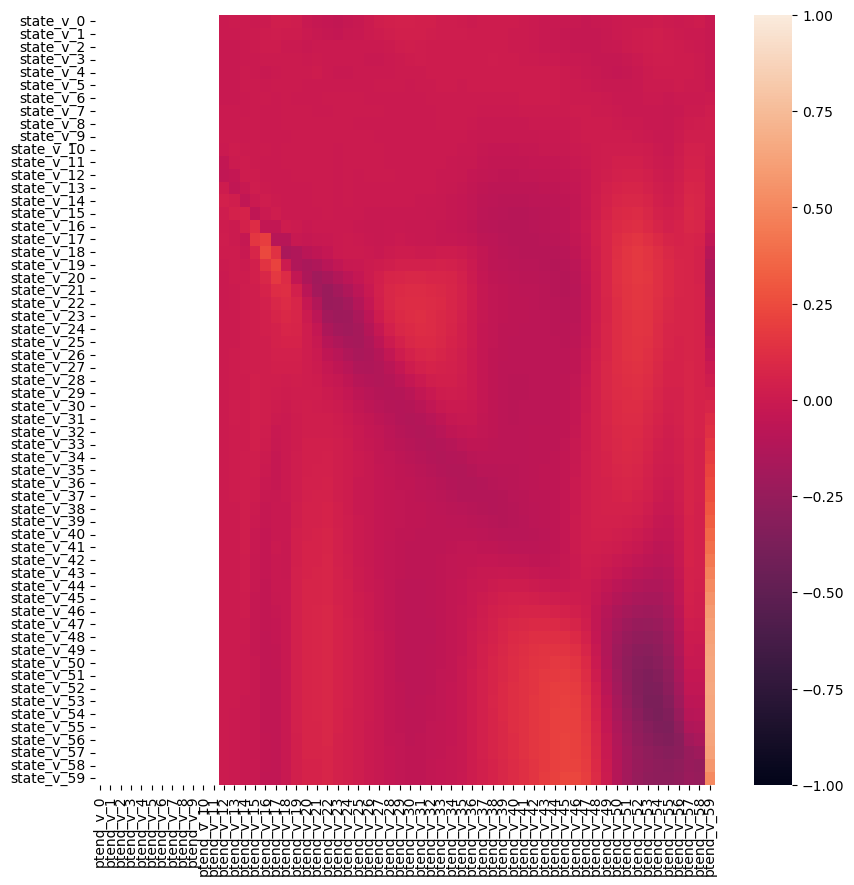

/opt/mamba/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/mamba/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


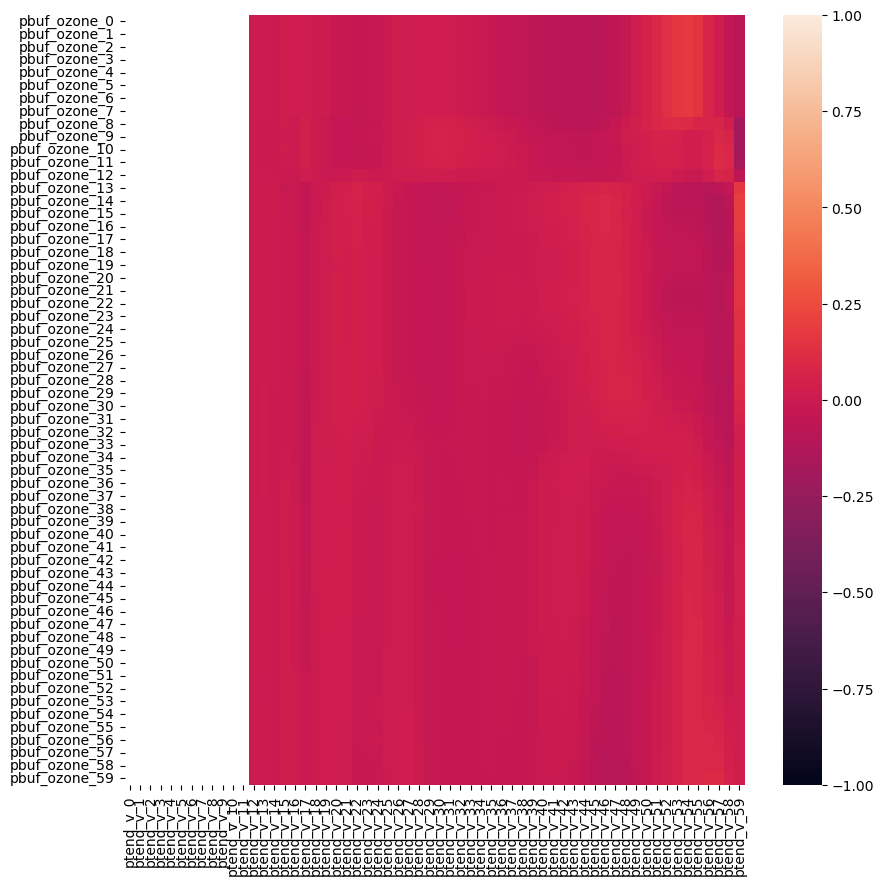

/opt/mamba/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/mamba/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


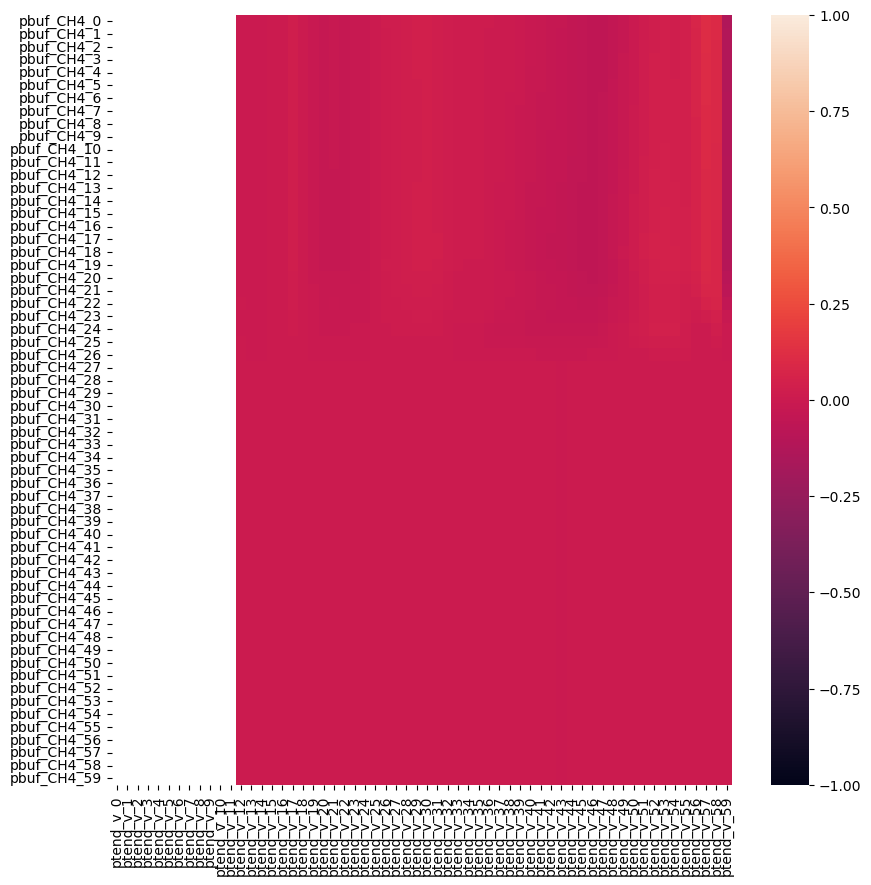

/opt/mamba/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/mamba/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


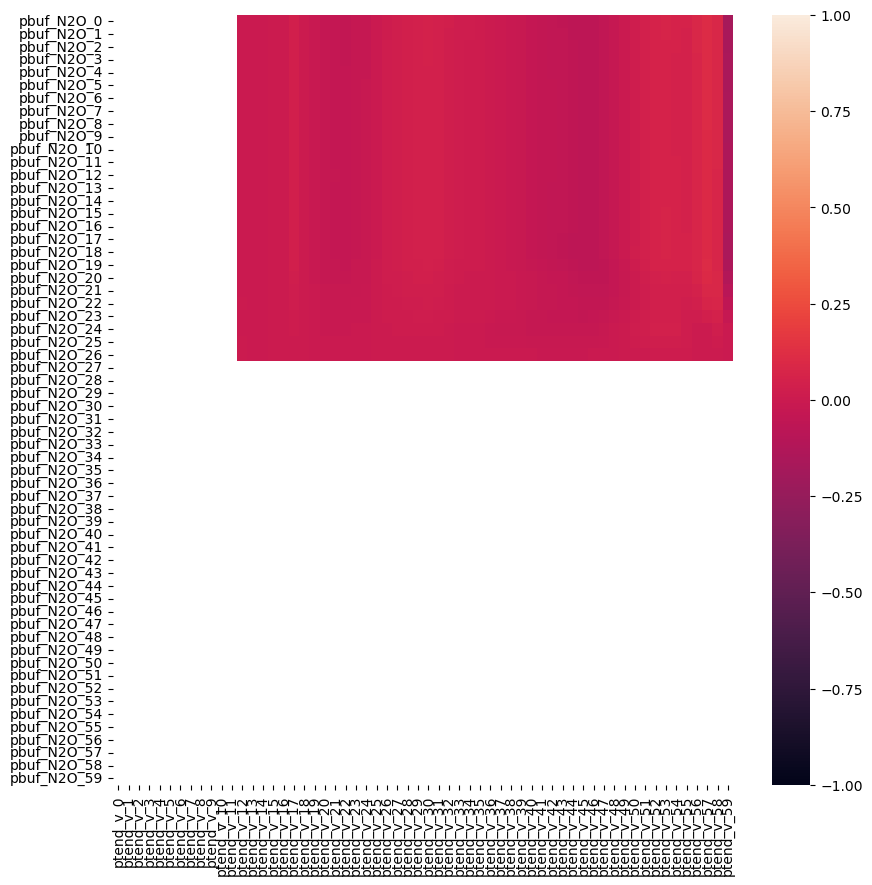

In [182]:
col = "ptend_v"
out_cols = [f"{col}_{i}" for i in range(60)]
in_cols = IN_SCALAR_COLUMNS
plot_correlation(df, in_cols, out_cols)
for col in IN_VECTOR_COLUMNS:
    in_cols = [f"{col}_{i}" for i in range(60)]
    plot_correlation(df, in_cols, out_cols)

## other

In [184]:
from pathlib import Path
from tqdm.auto import tqdm
i = 15
in_col = f"state_q0003_{i}"
out_col = f"ptend_q0003_{i}"
dfs = []
for filename in tqdm(sorted(Path("../data").glob("raw_train*.parquet"))[-30:]):
    dfs.append(
        pl.read_parquet(filename, columns=[in_col, out_col])
    )
x = pl.concat(dfs)

100% 30/30 [00:00<00:00, 65.24it/s]


In [185]:
x.select(pl.corr(in_col, out_col))

state_q0003_15
f64
0.461905


In [186]:
(x[f"state_q0003_{i}"] / x[f"ptend_q0003_{i}"]).describe()

statistic,value
str,f64
"""count""",3.000734e6
"""null_count""",0.0
"""mean""",NaN
"""std""",NaN
"""min""",-2.6801e8
"""25%""",-1200.0
"""50%""",-1200.0
"""75%""",NaN
"""max""",1.3047e7


In [187]:
x = x.with_columns(
    (-pl.col(f"state_q0003_{i}") / 1200).alias(f"pred_ptend_q0003_{i}")
)

In [188]:
x.filter((pl.col(f"pred_ptend_q0003_{i}") - pl.col(f"ptend_q0003_{i}")).abs() > 1e-13).select([f"state_q0003_{i}", f"pred_ptend_q0003_{i}", f"ptend_q0003_{i}"]).describe()# .select(pl.corr(f"pred_ptend_q0003_{i}", f"ptend_q0003_{i}"))

statistic,state_q0003_15,pred_ptend_q0003_15,ptend_q0003_15
str,f64,f64,f64
"""count""",7824.0,7824.0,7824.0
"""null_count""",0.0,0.0,0.0
"""mean""",1.9176e-7,-1.5980e-10,3.1261e-11
"""std""",0.000001,1.2193e-9,6.6151e-10
"""min""",6.8428e-13,-4.8111e-8,-6.5359e-9
"""25%""",3.4122e-8,-1.1916e-10,-9.6530e-14
"""50%""",7.2891e-8,-6.0733e-11,6.0319e-12
"""75%""",1.4299e-7,-2.8435e-11,1.5874e-11
"""max""",0.000058,-5.7023e-16,3.5259e-8


In [189]:
x.filter(pl.col(f"state_q0003_{i}") < 1e-13).shape

(2851877, 3)

In [190]:
x.filter(pl.col(f"state_q0003_{i}") < 1e-13).select(pl.corr(f"pred_ptend_q0003_{i}", f"ptend_q0003_{i}"))

pred_ptend_q0003_15
f64
1.0


In [197]:
xx = x.filter(pl.col(f"state_q0003_{i}") < 1e-12)
r2_score(xx[f"ptend_q0003_{i}"].to_numpy(), xx[f"pred_ptend_q0003_{i}"])

0.02352216313794553

In [156]:
from pathlib import Path
from tqdm.auto import tqdm
import polars as pl
from sklearn.metrics import r2_score
i = 27
in_col = f"state_q0002_{i}"
out_col = f"ptend_q0002_{i}"
dfs = []
for filename in tqdm(sorted(Path("../data").glob("raw_train*.parquet"))[-30:]):
    dfs.append(
        pl.read_parquet(filename, columns=[in_col, out_col])
    )
x = pl.concat(dfs)

100% 30/30 [00:00<00:00, 56.58it/s]


In [157]:
x.select(pl.corr(in_col, out_col))

state_q0002_27
f64
-0.965811


In [158]:
(x[f"state_q0002_{i}"] / x[f"ptend_q0002_{i}"]).describe()

statistic,value
str,f64
"""count""",3.000734e6
"""null_count""",0.0
"""mean""",NaN
"""std""",NaN
"""min""",-1200.0
"""25%""",-1200.0
"""50%""",-1200.0
"""75%""",-1200.0
"""max""",0.019724


In [159]:
x = x.with_columns(
    (-pl.col(f"state_q0002_{i}") / 1200).alias(f"pred_ptend_q0002_{i}")
)

In [160]:
x.filter((pl.col(f"pred_ptend_q0002_{i}") - pl.col(f"ptend_q0002_{i}")).abs() > 1e-13).select([f"state_q0002_{i}", f"pred_ptend_q0002_{i}", f"ptend_q0002_{i}"]).describe()# .select(pl.corr(f"pred_ptend_q0003_{i}", f"ptend_q0003_{i}"))

statistic,state_q0002_27,pred_ptend_q0002_27,ptend_q0002_27
str,f64,f64,f64
"""count""",1.0,1.0,1.0
"""null_count""",0.0,0.0,0.0
"""mean""",1.5987e-11,-1.3322e-14,8.1052e-10
"""std""",null,null,null
"""min""",1.5987e-11,-1.3322e-14,8.1052e-10
"""25%""",1.5987e-11,-1.3322e-14,8.1052e-10
"""50%""",1.5987e-11,-1.3322e-14,8.1052e-10
"""75%""",1.5987e-11,-1.3322e-14,8.1052e-10
"""max""",1.5987e-11,-1.3322e-14,8.1052e-10


In [161]:
x.filter(pl.col(f"state_q0002_{i}") < 1e-13).shape

(2933886, 3)

In [162]:
x.filter(pl.col(f"state_q0002_{i}") < 1e-13).select(pl.corr(f"pred_ptend_q0002_{i}", f"ptend_q0002_{i}"))

pred_ptend_q0002_27
f64
1.0


In [163]:
r2_score(x[f"ptend_q0002_{i}"].to_numpy(), x[f"pred_ptend_q0002_{i}"])

0.9327907914627014

## リーク探し

In [1]:
import sys
sys.path.append("..")
from pathlib import Path
import yaml

import numpy as np
import polars as pl
from tqdm.auto import tqdm
import matplotlib.pyplot as plt

from leap.utils import normalize

/opt/mamba/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2024-07-14 13:55:32.213207: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-07-14 13:55:33.187749: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [2]:
raw_df = pl.concat([
    pl.read_parquet("../data/raw_train_0_100041.parquet"),
    pl.read_parquet("../data/raw_train_100042_200067.parquet"),
    pl.read_parquet("../data/raw_train_200068_300091.parquet"),
    pl.read_parquet("../data/raw_train_300092_400128.parquet"),
    pl.read_parquet("../data/raw_train_400129_500155.parquet"),
    pl.read_parquet("../data/raw_train_500156_600205.parquet"),
    pl.read_parquet("../data/raw_train_600206_700209.parquet"),
    pl.read_parquet("../data/raw_train_700210_800216.parquet"),
    pl.read_parquet("../data/raw_train_800217_900236.parquet"),
    pl.read_parquet("../data/raw_train_900237_1000269.parquet"),
    pl.read_parquet("../data/raw_train_1000270_1100302.parquet"),
    pl.read_parquet("../data/raw_train_1100303_1200303.parquet"),
]) 

In [3]:
leak_df = pl.read_csv("../data/pbuf_ozone_2_mapping.csv")
leak_df.head()

pbuf_ozone_2,climsim_location_id,timestamp,lat,lon
f64,i64,str,f64,f64
7.9467e-7,0,"""2021-01-01 00:00:00""",-32.585029,320.270895
7.8003e-7,1,"""2021-01-01 00:00:00""",-35.991036,331.530965
8.5578e-7,2,"""2021-01-01 00:00:00""",-22.686525,320.436023
8.3707e-7,3,"""2021-01-01 00:00:00""",-25.369335,331.694079
7.7288e-7,4,"""2021-01-01 00:00:00""",-38.204116,342.97979


In [4]:
trn_paths = sorted(Path("../data/dataset_v6").glob("processed_train*.parquet"))
test_path = sorted(Path("../data/dataset_v6").glob("processed_test*.parquet"))
len(trn_paths), len(test_path)

(100, 1)

In [5]:
def load_data(paths, cols):
    dfs = []
    for filename in tqdm(paths):
        dfs.append(pl.read_parquet(filename, columns=cols))
    return pl.concat(dfs)

In [6]:
trn_df = load_data(trn_paths, ["sample_id", "location", "timestamp", "pbuf_ozone"])
trn_df = trn_df.with_columns(
    pl.col("pbuf_ozone").list[i].cast(pl.Float64).alias(f"pbuf_ozone_{i}")
    for i in range(60)
).drop("pbuf_ozone").sort(["timestamp", "location"])
methods = yaml.safe_load(open("../data/dataset_v6/scaler_methods.yaml"))
trn_df = normalize(trn_df, methods, "../data/", reverse=True)

100% 100/100 [00:26<00:00,  3.73it/s]


In [7]:
i = 0
trn_df[i, "pbuf_ozone_2"], raw_df[i, "pbuf_ozone_2"]

(8.072300820311941e-07, 8.072300830261897e-07)

<Axes: >

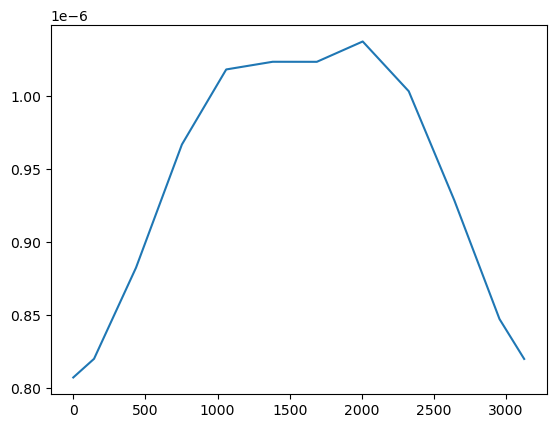

In [8]:
raw_df[i::384, "pbuf_ozone_2"].to_pandas().plot()

<Axes: >

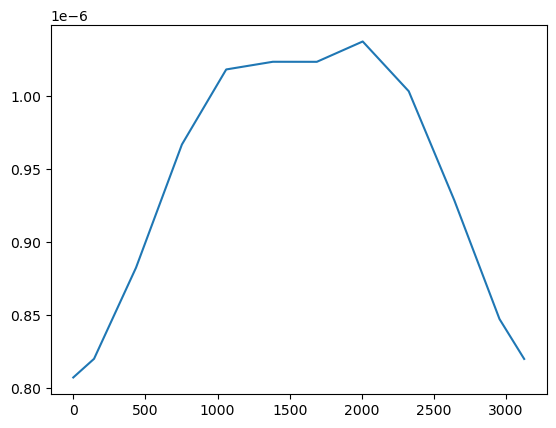

In [9]:
trn_df[i:len(raw_df):384, "pbuf_ozone_2"].to_pandas().plot()

In [10]:
trn_df.filter(pl.col("location") == 161)

sample_id,location,timestamp,pbuf_ozone_0,pbuf_ozone_1,pbuf_ozone_2,pbuf_ozone_3,pbuf_ozone_4,pbuf_ozone_5,pbuf_ozone_6,pbuf_ozone_7,pbuf_ozone_8,pbuf_ozone_9,pbuf_ozone_10,pbuf_ozone_11,pbuf_ozone_12,pbuf_ozone_13,pbuf_ozone_14,pbuf_ozone_15,pbuf_ozone_16,pbuf_ozone_17,pbuf_ozone_18,pbuf_ozone_19,pbuf_ozone_20,pbuf_ozone_21,pbuf_ozone_22,pbuf_ozone_23,pbuf_ozone_24,pbuf_ozone_25,pbuf_ozone_26,pbuf_ozone_27,pbuf_ozone_28,pbuf_ozone_29,pbuf_ozone_30,pbuf_ozone_31,pbuf_ozone_32,pbuf_ozone_33,pbuf_ozone_34,pbuf_ozone_35,pbuf_ozone_36,pbuf_ozone_37,pbuf_ozone_38,pbuf_ozone_39,pbuf_ozone_40,pbuf_ozone_41,pbuf_ozone_42,pbuf_ozone_43,pbuf_ozone_44,pbuf_ozone_45,pbuf_ozone_46,pbuf_ozone_47,pbuf_ozone_48,pbuf_ozone_49,pbuf_ozone_50,pbuf_ozone_51,pbuf_ozone_52,pbuf_ozone_53,pbuf_ozone_54,pbuf_ozone_55,pbuf_ozone_56,pbuf_ozone_57,pbuf_ozone_58,pbuf_ozone_59
str,i64,i64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
"""train_161""",161,0,3.0904e-7,5.5660e-7,9.9765e-7,0.000002,0.000003,0.000005,0.000009,0.000014,0.000016,0.000017,0.000016,0.000013,0.000009,0.000006,0.000003,0.000002,6.2716e-7,1.3501e-7,6.4866e-8,5.2212e-8,4.6280e-8,4.3272e-8,4.1641e-8,4.0890e-8,4.0878e-8,4.1130e-8,4.1549e-8,4.2453e-8,4.3404e-8,4.4957e-8,4.6563e-8,4.7666e-8,4.8653e-8,4.8589e-8,4.6742e-8,4.4850e-8,4.3728e-8,4.2874e-8,4.2024e-8,3.9326e-8,3.6114e-8,3.3048e-8,3.0474e-8,2.8908e-8,2.7420e-8,2.6005e-8,2.4985e-8,2.4725e-8,2.4480e-8,2.4252e-8,2.4038e-8,2.4214e-8,2.4422e-8,2.4624e-8,2.4825e-8,2.4957e-8,2.5041e-8,2.5126e-8,2.5223e-8,2.5308e-8
"""train_545""",161,1,3.0902e-7,5.5657e-7,9.9759e-7,0.000002,0.000003,0.000005,0.000009,0.000014,0.000016,0.000017,0.000016,0.000013,0.000009,0.000006,0.000003,0.000002,6.2701e-7,1.3496e-7,6.4822e-8,5.2176e-8,4.6251e-8,4.3248e-8,4.1621e-8,4.0871e-8,4.0861e-8,4.1112e-8,4.1532e-8,4.2430e-8,4.3381e-8,4.4927e-8,4.6532e-8,4.7645e-8,4.8633e-8,4.8624e-8,4.6784e-8,4.4898e-8,4.3754e-8,4.2899e-8,4.2050e-8,3.9432e-8,3.6225e-8,3.3166e-8,3.0544e-8,2.8980e-8,2.7494e-8,2.6082e-8,2.4999e-8,2.4739e-8,2.4495e-8,2.4267e-8,2.4053e-8,2.4189e-8,2.4396e-8,2.4598e-8,2.4798e-8,2.4943e-8,2.5026e-8,2.5111e-8,2.5206e-8,2.5302e-8
"""train_929""",161,2,3.0901e-7,5.5653e-7,9.9754e-7,0.000002,0.000003,0.000005,0.000009,0.000014,0.000016,0.000017,0.000016,0.000013,0.000009,0.000006,0.000003,0.000002,6.2686e-7,1.3490e-7,6.4777e-8,5.2139e-8,4.6222e-8,4.3224e-8,4.1600e-8,4.0853e-8,4.0844e-8,4.1096e-8,4.1517e-8,4.2413e-8,4.3364e-8,4.4909e-8,4.6515e-8,4.7634e-8,4.8624e-8,4.8639e-8,4.6802e-8,4.4920e-8,4.3767e-8,4.2912e-8,4.2062e-8,3.9475e-8,3.6271e-8,3.3214e-8,3.0573e-8,2.9009e-8,2.7524e-8,2.6111e-8,2.5002e-8,2.4742e-8,2.4498e-8,2.4271e-8,2.4057e-8,2.4176e-8,2.4383e-8,2.4585e-8,2.4784e-8,2.4934e-8,2.5017e-8,2.5101e-8,2.5195e-8,2.5296e-8
"""train_1313""",161,3,3.0899e-7,5.5650e-7,9.9748e-7,0.000002,0.000003,0.000005,0.000009,0.000014,0.000016,0.000017,0.000016,0.000013,0.000009,0.000006,0.000003,0.000002,6.2671e-7,1.3485e-7,6.4733e-8,5.2103e-8,4.6193e-8,4.3200e-8,4.1580e-8,4.0835e-8,4.0828e-8,4.1081e-8,4.1503e-8,4.2402e-8,4.3354e-8,4.4904e-8,4.6515e-8,4.7634e-8,4.8626e-8,4.8629e-8,4.6794e-8,4.4913e-8,4.3765e-8,4.2909e-8,4.2057e-8,3.9447e-8,3.6241e-8,3.3181e-8,3.0553e-8,2.8987e-8,2.7500e-8,2.6086e-8,2.4994e-8,2.4734e-8,2.4490e-8,2.4262e-8,2.4048e-8,2.4178e-8,2.4385e-8,2.4587e-8,2.4786e-8,2.4932e-8,2.5015e-8,2.5098e-8,2.5192e-8,2.5290e-8
"""train_1697""",161,4,3.0897e-7,5.5647e-7,9.9742e-7,0.000002,0.000003,0.000005,0.000009,0.000014,0.000016,0.000017,0.000016,0.000013,0.000009,0.000006,0.000003,0.000002,6.2655e-7,1.3479e-7,6.4689e-8,5.2067e-8,4.6164e-8,4.3177e-8,4.1559e-8,4.0817e-8,4.0811e-8,4.1068e-8,4.1492e-8,4.2396e-8,4.3351e-8,4.4912e-8,4.6528e-8,4.7643e-8,4.8639e-8,4.8599e-8,4.6763e-8,4.4882e-8,4.3752e-8,4.2893e-8,4.2038e-8,3.9360e-8,3.6147e-8,3.3082e-8,3.0493e-8,2.8923e-8,2.

In [11]:
leak_df.filter(pl.col("climsim_location_id") == 161)

pbuf_ozone_2,climsim_location_id,timestamp,lat,lon
f64,i64,str,f64,f64
9.9102e-7,161,"""2021-01-01 00:00:00""",5.014678,151.852076
9.9104e-7,161,"""2021-01-01 00:20:00""",5.014678,151.852076
9.9106e-7,161,"""2021-01-01 00:40:00""",5.014678,151.852076
9.9107e-7,161,"""2021-01-01 01:00:00""",5.014678,151.852076
9.9109e-7,161,"""2021-01-01 01:20:00""",5.014678,151.852076
…,…,…,…,…
9.9094e-7,161,"""2021-12-31 22:20:00""",5.014678,151.852076
9.9096e-7,161,"""2021-12-31 22:40:00""",5.014678,151.852076
9.9097e-7,161,"""2021-12-31 23:00:00""",5.014678,151.852076


In [12]:
leak_df[["lat", "lon"]].describe()

statistic,lat,lon
str,f64,f64
"""count""",1.009152e7,1.009152e7
"""null_count""",0.0,0.0
"""mean""",0.0,180.0
"""std""",38.871366,103.664391
"""min""",-82.058859,5.633247
"""25%""",-28.030652,95.633247
"""50%""",4.434555,185.633247
"""75%""",28.030652,264.366753
"""max""",82.058859,354.366753


In [13]:
leak_df[7202081]

pbuf_ozone_2,climsim_location_id,timestamp,lat,lon
f64,i64,str,f64,f64
9.7665e-7,161,"""2021-09-18 11:40:00""",5.014678,151.852076


In [14]:
# for i in range(0, 384, 20):
#     leak_df["pbuf_ozone_2"][i::384].to_pandas().plot()
#     plt.show()

<Axes: >

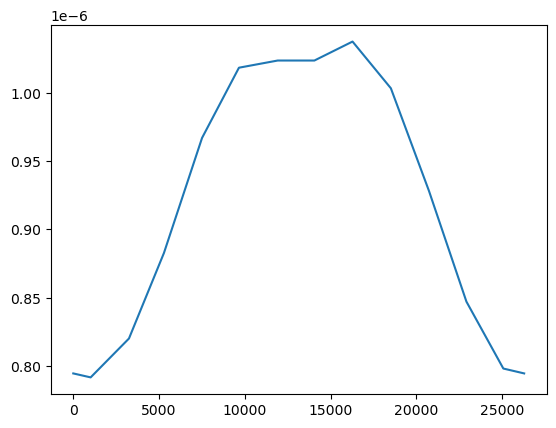

In [15]:
leak_df["pbuf_ozone_2"][::384].to_pandas().plot()

<Axes: >

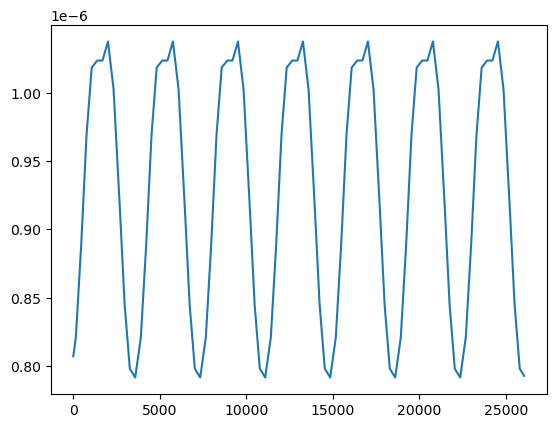

In [16]:
trn_df[::384]["pbuf_ozone_2"].to_pandas().plot()

In [17]:
len(trn_df[::384]), trn_df[::384].n_unique("pbuf_ozone_2")

(26049, 26029)

In [18]:
leak_df[::384]

pbuf_ozone_2,climsim_location_id,timestamp,lat,lon
f64,i64,str,f64,f64
7.9467e-7,0,"""2021-01-01 00:00:00""",-32.585029,320.270895
7.9467e-7,0,"""2021-01-01 00:20:00""",-32.585029,320.270895
7.9467e-7,0,"""2021-01-01 00:40:00""",-32.585029,320.270895
7.9466e-7,0,"""2021-01-01 01:00:00""",-32.585029,320.270895
7.9466e-7,0,"""2021-01-01 01:20:00""",-32.585029,320.270895
…,…,…,…,…
7.9469e-7,0,"""2021-12-31 22:20:00""",-32.585029,320.270895
7.9468e-7,0,"""2021-12-31 22:40:00""",-32.585029,320.270895
7.9468e-7,0,"""2021-12-31 23:00:00""",-32.585029,320.270895


In [19]:
# for i in range(100):
#     print(leak_df.filter(pl.col("pbuf_ozone_2") == raw_df[i*384, "pbuf_ozone_2"]))

In [20]:
26_280 / 365 / 24

3.0

In [21]:
leak_df

pbuf_ozone_2,climsim_location_id,timestamp,lat,lon
f64,i64,str,f64,f64
7.9467e-7,0,"""2021-01-01 00:00:00""",-32.585029,320.270895
7.8003e-7,1,"""2021-01-01 00:00:00""",-35.991036,331.530965
8.5578e-7,2,"""2021-01-01 00:00:00""",-22.686525,320.436023
8.3707e-7,3,"""2021-01-01 00:00:00""",-25.369335,331.694079
7.7288e-7,4,"""2021-01-01 00:00:00""",-38.204116,342.97979
…,…,…,…,…
9.6753e-7,379,"""2021-12-31 23:40:00""",48.711372,159.599237
9.7199e-7,380,"""2021-12-31 23:40:00""",52.704778,135.0
9.8344e-7,381,"""2021-12-31 23:40:00""",45.338123,123.277482


In [22]:
test_df = pl.read_parquet("../data/raw_test.parquet")

In [23]:
test_df["pbuf_ozone_2"]

pbuf_ozone_2
f64
9.3802e-7
9.8587e-7
0.000001
9.9595e-7
9.2312e-7
…
9.6220e-7
9.6361e-7
7.8974e-7


In [24]:
raw_df.join(leak_df, on="pbuf_ozone_2", how="left").null_count()

sample_id,state_t_0,state_t_1,state_t_2,state_t_3,state_t_4,state_t_5,state_t_6,state_t_7,state_t_8,state_t_9,state_t_10,state_t_11,state_t_12,state_t_13,state_t_14,state_t_15,state_t_16,state_t_17,state_t_18,state_t_19,state_t_20,state_t_21,state_t_22,state_t_23,state_t_24,state_t_25,state_t_26,state_t_27,state_t_28,state_t_29,state_t_30,state_t_31,state_t_32,state_t_33,state_t_34,state_t_35,…,ptend_v_35,ptend_v_36,ptend_v_37,ptend_v_38,ptend_v_39,ptend_v_40,ptend_v_41,ptend_v_42,ptend_v_43,ptend_v_44,ptend_v_45,ptend_v_46,ptend_v_47,ptend_v_48,ptend_v_49,ptend_v_50,ptend_v_51,ptend_v_52,ptend_v_53,ptend_v_54,ptend_v_55,ptend_v_56,ptend_v_57,ptend_v_58,ptend_v_59,cam_out_NETSW,cam_out_FLWDS,cam_out_PRECSC,cam_out_PRECC,cam_out_SOLS,cam_out_SOLL,cam_out_SOLSD,cam_out_SOLLD,climsim_location_id,timestamp,lat,lon
u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,…,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,…,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [25]:
test_df[["sample_id", "pbuf_ozone_2"]].join(leak_df, on="pbuf_ozone_2", how="left").filter(pl.col("lon").is_null())[:, 1].to_numpy()[-1]

9.175267995192168e-07

In [26]:
leak_df.filter((pl.col("climsim_location_id") == 176) & (pl.col("timestamp") == "2021-03-06 08:00:00"))[0, 0]

9.401062719499999e-07

In [27]:
sub_leak_df = pl.concat([
    leak_df.filter(pl.col("timestamp").str.contains("00:00:00")),
    leak_df.filter(pl.col("timestamp").str.contains("08:00:00")),
    leak_df.filter(pl.col("timestamp").str.contains("16:00:00")),    
])

In [28]:
sub_leak_df["pbuf_ozone_2"].n_unique()

420480

In [29]:
leak_df.with_columns((pl.col("pbuf_ozone_2")-9.4010627195e-07).abs()).sort("pbuf_ozone_2")

pbuf_ozone_2,climsim_location_id,timestamp,lat,lon
f64,i64,str,f64,f64
1.0588e-22,176,"""2021-03-06 08:00:00""",22.686525,140.436023
2.9356e-15,226,"""2021-06-16 10:00:00""",13.297919,230.542589
6.7890e-15,75,"""2021-09-27 15:20:00""",-27.156533,106.955399
1.2328e-14,168,"""2021-11-07 13:00:00""",5.606215,185.633247
1.4151e-14,24,"""2021-04-24 20:20:00""",-16.807672,5.65245
…,…,…,…,…
2.9835e-7,297,"""2021-01-14 22:40:00""",-72.293344,71.940417
2.9836e-7,297,"""2021-01-14 23:00:00""",-72.293344,71.940417
2.9836e-7,297,"""2021-01-14 23:20:00""",-72.293344,71.940417


In [30]:
pbuf_df = test_df[["sample_id", "pbuf_ozone_2"]].join(leak_df, on="pbuf_ozone_2", how="left").filter(pl.col("lon").is_null())[["pbuf_ozone_2"]]
len(pbuf_df)

132005

In [36]:
0.70 * 4/5 + 0.77 * 1/5

0.714

In [34]:
sample_id_df = test_df[["sample_id", "pbuf_ozone_2"]].join(leak_df, on="pbuf_ozone_2", how="left").filter(pl.col("lon").is_null())[["sample_id"]]
sample_id_df.write_parquet("../data/sample_ids.parquet")
len(sample_id_df), sample_id_df

(132005,
 shape: (132_005, 1)
 ┌─────────────┐
 │ sample_id   │
 │ ---         │
 │ str         │
 ╞═════════════╡
 │ test_0      │
 │ test_10000  │
 │ test_100007 │
 │ test_10002  │
 │ test_100024 │
 │ …           │
 │ test_99968  │
 │ test_99976  │
 │ test_99977  │
 │ test_99986  │
 │ test_99988  │
 └─────────────┘)

In [31]:
pbuf_df = pbuf_df.rename({"pbuf_ozone_2": "main_pbuf_ozone_2"}).with_columns(pl.lit(0).alias("dummy"))
pbuf_df.head()

main_pbuf_ozone_2,dummy
f64,i32
9.3802e-7,0
9.2312e-7,0
9.3442e-7,0
0.000001,0
9.3531e-7,0


In [33]:
tmp = pbuf_df[:1000].join(sub_leak_df.with_columns(pl.lit(0).alias("dummy"))[["pbuf_ozone_2", "dummy"]], on="dummy", how="outer")

In [37]:
tmp = (
    tmp
    .with_columns((pl.col("main_pbuf_ozone_2") - pl.col("pbuf_ozone_2")).abs().alias("diff"))
)

In [40]:
pbuf_df[0,0]

9.38019976953784e-07

In [34]:
leak_df["pbuf_ozone_2"].n_unique(), test_df["pbuf_ozone_2"].n_unique()

(10091520, 420480)

In [35]:
leak_df.with_columns(pl.col("pbuf_ozone_2").round(22))["pbuf_ozone_2"].n_unique()

10091520

In [36]:
test_df.with_columns(pl.col("pbuf_ozone_2").round(22))["pbuf_ozone_2"].n_unique()

420480

In [37]:
test_df.shape

(625000, 557)

In [143]:
digit = 15
yy = (
    test_df
    .with_columns(pl.col("pbuf_ozone_2").round(digit))
    .join(
        sub_leak_df.with_columns(pl.col("pbuf_ozone_2").round(digit)),
        on="pbuf_ozone_2",
        how="left",
    )
)
print(len(yy))
zz = (
    yy
    .filter(pl.col("lat").is_null())
    .select(["sample_id", "pbuf_ozone_2"])
)# [0, 1]
print(len(zz))

626223
0


In [148]:
leak_df["lon"].max()

354.3667531060166

In [151]:
leak_df.with_columns(pl.col("timestamp").str.to_datetime().dt.hour()).describe()

statistic,pbuf_ozone_2,climsim_location_id,timestamp,lat,lon
str,f64,f64,f64,f64,f64
"""count""",1.009152e7,1.009152e7,1.009152e7,1.009152e7,1.009152e7
"""null_count""",0.0,0.0,0.0,0.0,0.0
"""mean""",9.2608e-7,191.5,11.5,0.0,180.0
"""std""",7.9094e-8,110.850881,6.922187,38.871366,103.664391
"""min""",6.4173e-7,0.0,0.0,-82.058859,5.633247
"""25%""",8.8476e-7,96.0,6.0,-28.030652,95.633247
"""50%""",9.4412e-7,192.0,12.0,4.434555,185.633247
"""75%""",9.8352e-7,287.0,17.0,28.030652,264.366753
"""max""",0.000001,383.0,23.0,82.058859,354.366753


In [119]:
yy["sample_id"].value_counts().sort("count")

sample_id,count
str,u32
"""test_444329""",1
"""test_321073""",1
"""test_628008""",1
"""test_602923""",1
"""test_208091""",1
…,…
"""test_741669""",2
"""test_370597""",2
"""test_47302""",2


In [120]:
yy.filter(pl.col("sample_id") == "test_237041")

sample_id,state_t_0,state_t_1,state_t_2,state_t_3,state_t_4,state_t_5,state_t_6,state_t_7,state_t_8,state_t_9,state_t_10,state_t_11,state_t_12,state_t_13,state_t_14,state_t_15,state_t_16,state_t_17,state_t_18,state_t_19,state_t_20,state_t_21,state_t_22,state_t_23,state_t_24,state_t_25,state_t_26,state_t_27,state_t_28,state_t_29,state_t_30,state_t_31,state_t_32,state_t_33,state_t_34,state_t_35,…,pbuf_N2O_27,pbuf_N2O_28,pbuf_N2O_29,pbuf_N2O_30,pbuf_N2O_31,pbuf_N2O_32,pbuf_N2O_33,pbuf_N2O_34,pbuf_N2O_35,pbuf_N2O_36,pbuf_N2O_37,pbuf_N2O_38,pbuf_N2O_39,pbuf_N2O_40,pbuf_N2O_41,pbuf_N2O_42,pbuf_N2O_43,pbuf_N2O_44,pbuf_N2O_45,pbuf_N2O_46,pbuf_N2O_47,pbuf_N2O_48,pbuf_N2O_49,pbuf_N2O_50,pbuf_N2O_51,pbuf_N2O_52,pbuf_N2O_53,pbuf_N2O_54,pbuf_N2O_55,pbuf_N2O_56,pbuf_N2O_57,pbuf_N2O_58,pbuf_N2O_59,climsim_location_id,timestamp,lat,lon
str,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,…,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,i64,str,f64,f64
"""test_237041""",213.255332,214.659516,236.534778,248.095533,256.696209,257.966843,253.4739,244.935405,238.816471,236.7569,227.506387,218.533278,214.27098,212.069702,208.193993,203.638395,192.851114,187.324305,185.881389,191.360761,198.026507,204.339824,210.272973,215.766509,221.048298,226.053403,230.963687,235.923711,240.737085,245.224434,249.5051,253.396576,257.160982,260.918193,264.785579,268.450063,…,4.9086e-7,4.9086e-7,4.9086e-7,4.9086e-7,4.9086e-7,4.9086e-7,4.9086e-7,4.9086e-7,4.9086e-7,4.9086e-7,4.9086e-7,4.9086e-7,4.9086e-7,4.9086e-7,4.9086e-7,4.9086e-7,4.9086e-7,4.9086e-7,4.9086e-7,4.9086e-7,4.9086e-7,4.9086e-7,4.9086e-7,4.9086e-7,4.9086e-7,4.9086e-7,4.9086e-7,4.9086e-7,4.9086e-7,4.9086e-7,4.9086e-7,4.9086e-7,4.9086e-7,215,"""2021-12-06 16:00:00""",-5.606215,264.366753


In [44]:
test_df.filter(pl.col("sample_id") == "test_15985")[0, "pbuf_ozone_2"]

9.4010627195e-07

In [50]:
test_df.filter(pl.col("sample_id") == "test_15985").with_columns(pl.col("pbuf_ozone_2").round(digit))[0, "pbuf_ozone_2"]

9.40106272e-07

In [55]:
leak_df.filter((pl.col("climsim_location_id") == 176) & (pl.col("timestamp") == "2021-03-06 08:00:00"))[0, 0]

9.401062719499999e-07

In [57]:
leak_df.filter((pl.col("climsim_location_id") == 176) & (pl.col("timestamp") == "2021-03-06 08:00:00")).with_columns(pl.col("pbuf_ozone_2").round(digit))
[0, 0]

9.401062719e-07

In [71]:
test_df["pbuf_ozone_2"].to_numpy()

array([9.38019977e-07, 9.85870499e-07, 1.03762990e-06, ...,
       7.89744893e-07, 9.07115592e-07, 1.04241272e-06])

In [73]:
leak_df["pbuf_ozone_2"].to_numpy()

array([7.94671266e-07, 7.80032617e-07, 8.55780941e-07, ...,
       9.83437150e-07, 9.77224982e-07, 9.88469276e-07])

In [140]:
len(sub_leak_df)

420480